## Initial Feature Selection

In [2]:
## Import WRDS to get cloud connection

import wrds
import time
import pandas as pd
from joblib import Parallel, delayed
import numpy as np
from tqdm.auto import tqdm
import dask
import dask.dataframe as dd
import multiprocessing
import sqlite3
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import xgboost as xgb
from sklearn.model_selection import cross_val_score, RepeatedKFold
from sklearn.metrics import mean_squared_error, r2_score
import shap

#### Importing Inital Data from WRDS

In [326]:
## Establish or Close Connection

conn = wrds.Connection()
# conn.close()

WRDS recommends setting up a .pgpass file.
Created .pgpass file successfully.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done


In [327]:
## CCM


link = conn.raw_sql("""
    SELECT gvkey, lpermno as permno, linkdt, linkenddt
    FROM crsp.ccmxpf_linktable
    WHERE linktype IN ('LU', 'LC') AND linkprim IN ('P', 'C')
""", date_cols=['linkdt', 'linkenddt'])

link = pd.DataFrame(link)

link.to_csv('Linkage 7 Years.csv', index=False)

In [296]:
## CRSP

dfs = []
start_time = time.time()
for year in range(2016, 2023):
    print(f"Fetching data for year: {year}")
    query = f"""
    SELECT  dlycaldt, permno, ticker, primaryexch, dlyret, dlyvol, dlycap
    FROM crsp_a_stock.wrds_dsfv2_query
    WHERE DlyCalDt BETWEEN '{year}-01-01' AND '{year}-12-31' 
    AND SecurityEndDt >= '2016-01-01'
    AND SecInfoEndDt >= '2016-01-01'
    AND DlyRetMissFlg = 'NA'
    AND DlyprcFlg = 'TR'
    AND SecurityActiveFlg = 'Y'
    ORDER BY DlyCalDt
    """
    df = conn.raw_sql(query, date_cols=['DlyCalDt'])
    overalls.append(df)
    print(f"Finished fetching data for year: {year}")

dsf = pd.concat(dfs, ignore_index=True)
end_time = time.time()
print(f"Total time taken: {end_time - start_time} seconds")

sec = pd.DataFrame(dsf)

sec.to_csv('Securities 7 Years.csv')

Fetching data for year: 2016
Finished fetching data for year: 2016
Fetching data for year: 2017
Finished fetching data for year: 2017
Fetching data for year: 2018
Finished fetching data for year: 2018
Fetching data for year: 2019
Finished fetching data for year: 2019
Fetching data for year: 2020
Finished fetching data for year: 2020
Fetching data for year: 2021
Finished fetching data for year: 2021
Fetching data for year: 2022
Finished fetching data for year: 2022
Total time taken: 290.39485907554626 seconds


In [328]:
## COMPUSTAT

fundq = []
start_time = time.time()
for year in range(2016, 2023):
    print(f"Fetching data for year: {year}")
    query = f"""
    SELECT datadate, gvkey, conm, 
    dlttq, dlcq, teqq, actq, lctq, 
    atq, niq, mkvaltq, prccq, cshoq 
    FROM comp_na_daily_all.fundq
    WHERE datadate BETWEEN '{year}-01-01' AND '{year}-12-31' 
    ORDER BY datadate
    """
    fund = conn.raw_sql(query, date_cols=['datadate'])
    fundq.append(fund)
    print(f"Finished fetching data for year: {year}")

fundq = pd.concat(fundq, ignore_index=True)
end_time = time.time()
print(f"Total time taken: {end_time - start_time} seconds")

fund = pd.DataFrame(fundq)

fund.to_csv('Fundamentals 7 Years.csv')

Fetching data for year: 2016
Finished fetching data for year: 2016
Fetching data for year: 2017
Finished fetching data for year: 2017
Fetching data for year: 2018
Finished fetching data for year: 2018
Fetching data for year: 2019
Finished fetching data for year: 2019
Fetching data for year: 2020
Finished fetching data for year: 2020
Fetching data for year: 2021
Finished fetching data for year: 2021
Fetching data for year: 2022
Finished fetching data for year: 2022
Total time taken: 7.922384023666382 seconds


#### Loading Initial WRDS Data

In [445]:
## CRSP and Compustat

num_cores = multiprocessing.cpu_count()
print(f"Number of CPU cores: {num_cores}")

def process_data(chunk):
    return chunk

def parallel_read_csv(file_path, chunk_size=100000):
    start_time = time.time() 
    chunks = pd.read_csv(file_path, chunksize=chunk_size, low_memory=False)
    processed_chunks = Parallel(n_jobs=num_cores)(
        delayed(process_data)(chunk) for chunk in tqdm(chunks, desc="Processing", unit="chunk")
    )
    result_df = pd.concat(processed_chunks, axis=0)
    end_time = time.time() 
    total_time = end_time - start_time
    print(f"Total time taken: {total_time:.2f} seconds")
    return result_df
 

sec_file_path = '/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Securities 7 Years.csv'
fund_file_path = '/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Fundamentals 7 Years.csv'

fund = parallel_read_csv(fund_file_path)
sec = parallel_read_csv(sec_file_path)

Number of CPU cores: 10


Processing: 0chunk [00:00, ?chunk/s]

Total time taken: 1.58 seconds


Processing: 0chunk [00:00, ?chunk/s]

Total time taken: 9.52 seconds


In [446]:
## CCM

linkage = pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Linkage 7 Years.csv')

In [447]:
## Checking the Loaded Data

print(f"The length of the sec dataset is {len(sec)}")
print(f"Number of unique columns in sec is {len(sec.columns)}")
print(f"Max Date in in sec is {max(sec['dlycaldt'])}")
print(f"Min Date in in sec is {min(sec['dlycaldt'])}")

print(f"The length of the fund dataset is {len(fund)}")
print(f"Number of unique columns in fund is {len(fund.columns)}")
print(f"Max Date in in fund is {max(fund['datadate'])}")
print(f"Min Date in in sec is {min(fund['datadate'])}")

print(f"The length of the linkage dataset is {len(linkage)}")
print(f"Number of unique columns in linkage is {len(linkage.columns)}")
print(f"Min Date in in linkage is {min(linkage['linkdt'])}")

The length of the sec dataset is 13498860
Number of unique columns in sec is 9
Max Date in in sec is 2022-12-30
Min Date in in sec is 2016-01-04
The length of the fund dataset is 328583
Number of unique columns in fund is 14
Max Date in in fund is 2022-12-31
Min Date in in sec is 2016-01-31
The length of the linkage dataset is 32495
Number of unique columns in linkage is 4
Min Date in in linkage is 1949-07-01


#### Processing the Initial Data

In [448]:
## Adding GVKEY to Securities Dataframe

sec['dlycaldt'] = pd.to_datetime(sec['dlycaldt'])
linkage['linkdt'] = pd.to_datetime(linkage['linkdt'])
linkage['linkenddt'] = pd.to_datetime(linkage['linkenddt'])
sec['permno'] = sec['permno'].astype('float')
linkage['permno'] = linkage['permno'].astype('float')

def preprocess_linkage(linkage, sec_dates):
    filtered_linkage = linkage[
        (linkage['linkenddt'].isna() & (linkage['linkdt'] <= sec_dates.max())) |
        ((linkage['linkdt'] <= sec_dates.max()) & (linkage['linkenddt'] >= sec_dates.min()))
    ]
    return filtered_linkage

def select_gvkey(row):
    if pd.isna(row['linkenddt']):
        if row['dlycaldt'] >= row['linkdt']:
            return row['gvkey']
    else:
        if row['linkdt'] <= row['dlycaldt'] <= row['linkenddt']:
            return row['gvkey']
    return None

def process_chunk(chunk, filtered_linkage):
    merged_chunk = pd.merge(chunk, filtered_linkage, on='permno', how='left')
    merged_chunk['selected_gvkey'] = merged_chunk.apply(select_gvkey, axis=1)
    return merged_chunk

def merge_sec_link_parallel(sec, linkage, n_jobs=10):
    sec_dates = sec['dlycaldt']
    filtered_linkage = preprocess_linkage(linkage, sec_dates)
    chunks = np.array_split(sec, n_jobs)
    processed_chunks = Parallel(n_jobs=n_jobs)(delayed(process_chunk)(chunk, filtered_linkage) for chunk in chunks)
    seclinked = pd.concat(processed_chunks, axis=0)
    seclinked['valid_gvkey'] = seclinked.apply(lambda row: select_gvkey(row) if pd.notnull(row['gvkey']) else None, axis=1)
    
    return seclinked

start_time = time.time()
seclinked = merge_sec_link_parallel(sec, linkage, n_jobs=10)
end_time = time.time()
print(f"Parallel processing took {end_time - start_time} seconds")
print(f"Original sec rows: {len(sec)}, Merged sec rows: {len(seclinked)}")
seclinked.head(5)

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Parallel processing took 108.93709802627563 seconds
Original sec rows: 13498860, Merged sec rows: 13984516


,Unnamed: 0,dlycaldt,permno,ticker,primaryexch,dlyprc,dlyret,dlyvol,dlycap,gvkey,linkdt,linkenddt,selected_gvkey,valid_gvkey
0,0,2016-01-04,10001.0,EGAS,A,7.520,0.009396,15816.0,78997.60,12994.0,1986-01-09,2017-08-31,12994.0,12994.0
1,1,2016-01-04,10025.0,AEPI,Q,73.190,-0.051329,29246.0,373488.57,11903.0,1986-01-30,2017-01-31,11903.0,11903.0
2,2,2016-01-04,10026.0,JJSF,Q,113.090,-0.030685,80444.0,2112181.93,12825.0,1986-02-04,NaT,12825.0,12825.0
3,3,2016-01-04,10028.0,DGSE,A,0.312,-0.054546,192.0,3836.35,12096.0,1986-02-05,NaT,12096.0,12096.0
4,4,2016-01-04,10032.0,PLXS,Q,34.220,-0.020046,126414.0,1138704.72,12945.0,1986-02-05,NaT,12945.0,12945.0


In [449]:
## Checking the merged Securities Daily Dataset

seclinked = seclinked[seclinked['valid_gvkey'].notnull()]
seclinked['valid_gvkey'] = seclinked['valid_gvkey'].astype('float')

print(f"The length of the seclinked dataset is {len(seclinked)}")
print(f"Number of unique columns in seclinked is {len(seclinked.columns)}")
print(f"Max Date in in seclinked is {max(seclinked['dlycaldt'])}")
print(f"Min Date in in seclinked is {min(seclinked['dlycaldt'])}")

The length of the seclinked dataset is 9763719
Number of unique columns in seclinked is 14
Max Date in in seclinked is 2022-12-30 00:00:00
Min Date in in seclinked is 2016-01-04 00:00:00


In [450]:
## Comparing the companies present in both datasets

unique_sec_tickers = seclinked['valid_gvkey'].unique()
fund['gvkey'] = fund['gvkey'].astype('float')
unique_fund_tickers = fund['gvkey'].unique()
sec_tickers_set = set(unique_sec_tickers)
fund_tickers_set = set(unique_fund_tickers)

## Finding Common **(HIGH)**
common_tickers = sec_tickers_set.intersection(fund_tickers_set)
print(f"Common ticker symbols: {len(common_tickers)}")

## Finding ones missing in Compustat **(VERY LOW)**
unique_to_sec = sec_tickers_set.difference(fund_tickers_set)
print(f"Ticker symbols unique to sec DataFrame: {len(unique_to_sec)}")
 
## Finding ones missing in CRSP **(VERY HIGH)**
unique_to_fund = fund_tickers_set.difference(sec_tickers_set)
print(f"Ticker symbols unique to fund DataFrame: {len(unique_to_fund)}")

Common ticker symbols: 8195
Ticker symbols unique to sec DataFrame: 905
Ticker symbols unique to fund DataFrame: 8883


In [451]:
## Filtering both seclinked and fund datasets to only contain common gvkey's

fund.drop(columns = ['Unnamed: 0'], inplace = True)
seclinked.drop(columns = ['Unnamed: 0'], inplace = True)
fund = fund[fund['gvkey'].isin(common_tickers)]
seclinked = seclinked[seclinked['valid_gvkey'].isin(common_tickers)]

fund['datadate'] = pd.to_datetime(fund['datadate'])
fund['start_date'] = fund['datadate'] - pd.DateOffset(months=3) + pd.Timedelta(days=1)
fund['end_date'] = fund['datadate']

print(f"The length of the seclinked dataset is {len(seclinked)}")
print(f"Number of unique columns in seclinked is {len(seclinked.columns)}")
print(f"Number of unique gvkeys in seclinked is {seclinked['valid_gvkey'].nunique()}")

print(f"The length of the fund dataset is {len(fund)}")
print(f"Number of unique columns in fund is {len(fund.columns)}")
print(f"Number of unique gvkeys in fund is {fund['gvkey'].nunique()}")

The length of the seclinked dataset is 9492503
Number of unique columns in seclinked is 13
Number of unique gvkeys in seclinked is 8195
The length of the fund dataset is 174785
Number of unique columns in fund is 15
Number of unique gvkeys in fund is 8195


In [452]:
## Merging COMPUSTAT and CRSP Datasets 

def merge_and_filter_chunk(chunk, fund):
    merged = pd.merge(chunk, fund, left_on='valid_gvkey', right_on='gvkey', suffixes=('_sec', '_fund'))
    filtered = merged[(merged['dlycaldt'] >= merged['start_date']) & 
                      (merged['dlycaldt'] <= merged['datadate'])]
    return filtered

def process_chunks_in_parallel(seclinked, fund, chunk_size=20000, n_jobs=10):
    num_chunks = len(seclinked) // chunk_size + 1
    chunks = np.array_split(seclinked, num_chunks)
    results = Parallel(n_jobs=n_jobs)(
        delayed(merge_and_filter_chunk)(chunk, fund) 
        for chunk in tqdm(chunks, desc="Processing chunks", total=num_chunks)
    )
    final_df = pd.concat(results, axis=0).reset_index(drop=True)
    return final_df

start_time = time.time()
final_df = process_chunks_in_parallel(seclinked, fund, chunk_size=20000, n_jobs=10)
end_time = time.time()
print(f"Parallel processing took {end_time - start_time} seconds")

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Processing chunks:   0%|          | 0/475 [00:00<?, ?it/s]

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Dat

Parallel processing took 38.89345574378967 seconds


In [453]:
## Validating the Final Merged DataFrame

print(f"The length of the final_df dataset is {len(final_df)}")
print(f"Number of columns in final_df is {len(final_df.columns)}")
print(f"Max Date in final_df is {max(final_df['dlycaldt'])}")
print(f"Min Date in final_df is {min(final_df['dlycaldt'])}")
print(f"Number of unique gvkeys in final_df is {final_df['valid_gvkey'].nunique()}")

The length of the final_df dataset is 9357301
Number of columns in final_df is 28
Max Date in final_df is 2022-12-30 00:00:00
Min Date in final_df is 2016-01-04 00:00:00
Number of unique gvkeys in final_df is 8187


In [454]:
## Fix Final Data Frame

final_df.drop(columns = ['gvkey_fund', 'gvkey_sec', 'selected_gvkey', 'end_date', 'linkdt', 'linkenddt', 'start_date', 'dlyprc'], inplace = True)

print(final_df.columns)
print(f"The total number of columns now are: {len(final_df.columns)}")

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'dlycap', 'valid_gvkey', 'datadate', 'conm', 'dlttq', 'dlcq', 'teqq',
       'actq', 'lctq', 'atq', 'niq', 'mkvaltq', 'prccq', 'cshoq'],
      dtype='object')
The total number of columns now are: 20


#### Preprocessing Initial Merged Data for Feature Selection

In [455]:
## Checking % of NULL Values in Final_df

missing = final_df.isnull().mean() * 100
print(missing[missing > 0].sort_values(ascending=False))

actq       27.877718
lctq       27.836916
dlcq       16.428712
mkvaltq    15.898313
dlttq      10.436759
teqq        9.723616
atq         9.706292
niq         9.548523
prccq       7.077308
cshoq       1.549752
ticker      0.001282
dlyvol      0.000011
dtype: float64


##### Handling Null Values First

In [456]:
## Checking Null Value Effect

total_rows = final_df.shape[0]

# Number of rows with at least one null value
rows_with_nulls = final_df.isnull().any(axis=1).sum()

# Number of rows left after dropping rows with any null values
cleaned_df = pd.DataFrame(final_df.dropna())
rows_without_nulls = cleaned_df.shape[0]

# Display the results
print(f"Total number of rows: {total_rows}")
print(f"Number of rows with at least one null value: {rows_with_nulls}")
print(f"Number of rows after dropping rows with any null values: {rows_without_nulls}")
print(f"Number of unique gvkeys in cleaned_df is {cleaned_df['valid_gvkey'].nunique()}")

Total number of rows: 9357301
Number of rows with at least one null value: 3296847
Number of rows after dropping rows with any null values: 6060454
Number of unique gvkeys in cleaned_df is 5841


In [457]:
## Checking Distribution of Data Availability for all left Companies

cleaned_df['year_month'] = cleaned_df['dlycaldt'].dt.to_period('M')
months_of_data_by_gvkey = cleaned_df.groupby('valid_gvkey')['year_month'].nunique()
percentiles = months_of_data_by_gvkey.quantile([0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.10, 0.25, 0.50, 0.75, 0.90])

average_months_of_data = months_of_data_by_gvkey.mean()
std_dev_months_of_data = months_of_data_by_gvkey.std()
min_months_of_data = months_of_data_by_gvkey.min()
max_months_of_data = months_of_data_by_gvkey.max()
tenth = months_of_data_by_gvkey.quantile(0.05)

gvkeys_below_20th_percentile = months_of_data_by_gvkey[months_of_data_by_gvkey < tenth].index
num_gvkeys_below_20th_percentile = len(gvkeys_below_20th_percentile)
print(f"Number of unique GVKEYs below the 10th percentile: {num_gvkeys_below_20th_percentile}")

print(f"Average number of months of data: {average_months_of_data}")
print(f"Standard deviation of months of data: {std_dev_months_of_data}")
print(f"Minimum number of months of data: {min_months_of_data}")
print(f"Maximum number of months of data: {max_months_of_data}")
print("Percentiles of the number of months of data:")
print(percentiles)

Number of unique GVKEYs below the 10th percentile: 244
Average number of months of data: 49.91200136962849
Standard deviation of months of data: 29.89114603155005
Minimum number of months of data: 1
Maximum number of months of data: 84
Percentiles of the number of months of data:
0.01     3.0
0.02     3.0
0.03     4.0
0.04     5.0
0.05     6.0
0.06     6.0
0.07     7.0
0.08     9.0
0.09     9.0
0.10    10.0
0.25    20.0
0.50    51.0
0.75    84.0
0.90    84.0
Name: year_month, dtype: float64


In [458]:
## Dropping ALL rows with Null Values

final = pd.DataFrame(final_df.dropna())

In [459]:
## Validating Final's Data

print(f"The length of the final dataset is {len(final)}")
print(f"Number of unique columns in final is {len(final.columns)}")
print(f"Max Date in in final is {max(final['dlycaldt'])}")
print(f"Min Date in in final is {min(final['dlycaldt'])}")
print(f"Number of unique final_df in final is {final['valid_gvkey'].nunique()}")

The length of the final dataset is 6060454
Number of unique columns in final is 20
Max Date in in final is 2022-12-30 00:00:00
Min Date in in final is 2016-01-04 00:00:00
Number of unique final_df in final is 5841


##### Checking & Handling Duplicates

In [460]:
## Checking for Duplicates

exact_duplicates = final[final.duplicated(keep=False)]
exact_duplicates.head(5)

,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,dlycap,valid_gvkey,datadate,conm,dlttq,dlcq,teqq,actq,lctq,atq,niq,mkvaltq,prccq,cshoq
1515,2016-01-04,15506.0,CYRX,Q,0.029703,10710.0,15073.76,162146.0,2016-03-31,CRYOPORT INC,0.554,0.387,3.096,4.132,2.174,5.824,-2.710,24.9210,2.0342,12.251
1516,2016-01-04,15506.0,CYRX,Q,0.029703,10710.0,15073.76,162146.0,2016-03-31,CRYOPORT INC,0.554,0.387,3.096,4.132,2.174,5.824,-2.710,24.9210,2.0342,12.251
1556,2016-01-04,15644.0,SITO,Q,-0.004808,16975.0,35510.85,149360.0,2016-03-31,SITO MOBILE LTD,5.977,1.686,5.000,8.162,9.079,20.056,-1.171,44.2553,2.5500,17.355
1557,2016-01-04,15644.0,SITO,Q,-0.004808,16975.0,35510.85,149360.0,2016-03-31,SITO MOBILE LTD,5.977,1.686,5.000,8.162,9.079,20.056,-1.171,44.2553,2.5500,17.355
2661,2016-01-04,77486.0,UQM,A,-0.067970,58071.0,30021.87,22772.0,2016-03-31,UQM TECHNOLOGIES INC,0.000,0.000,21.712,10.116,1.350,23.351,-0.931,27.6496,0.5721,48.330


In [461]:
## Dropping Duplicates

final.drop_duplicates(inplace = True)

In [462]:
## Checking the length of the Final Dataframe after dropping duplicates

len(final)

6058077

#### EDA, Feature Engineering and More Pre-Processing for Model

In [463]:
## Feature Engineering in fund Dataframe and Dropping Redundant Columns ***

final['pb_ratio'] = final['prccq'] / (final['teqq'] / final['cshoq'])
final['debt_to_equity'] = (final['dlttq'] + final['dlcq']) / final['teqq']
final['current_ratio'] = final['actq'] / final['lctq']
final['ROE'] = final['niq'] / final['teqq']
final['ROA'] = final['niq'] / final['atq']  

final.drop(columns = ['prccq', 'teqq', 'dlcq', 'dlttq', 'actq', 'lctq', 'niq', 'cshoq'], inplace = True)

In [464]:
final.describe()

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,dlycaldt,permno,dlyret,dlyvol,dlycap,valid_gvkey,datadate,atq,mkvaltq,pb_ratio,debt_to_equity,current_ratio,ROE,ROA
count,6058077,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06,6058077,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06,6.058077e+06
mean,2019-08-06 10:51:54.328853504,4.794733e+04,4.275594e-04,1.458492e+06,8.493776e+06,6.572742e+04,2019-09-20 08:30:43.100509184,6.655952e+03,8.914273e+03,9.423081e+00,2.384906e+00,inf,-1.471716e-01,-3.289678e-02
min,2016-01-04 00:00:00,1.000100e+04,-9.652480e-01,1.000000e+00,2.970000e+01,1.004000e+03,2016-01-31 00:00:00,9.000000e-03,8.000000e-03,-7.355742e+04,-1.739130e+03,1.851852e-04,-1.492600e+04,-1.660000e+02
25%,2017-10-23 00:00:00,1.585300e+04,-1.588700e-02,9.043400e+04,1.522319e+05,1.792800e+04,2017-12-31 00:00:00,1.413430e+02,1.548307e+02,1.143682e+00,3.114440e-02,1.236664e+00,-7.654202e-02,-4.369817e-02
50%,2019-08-21 00:00:00,2.961200e+04,0.000000e+00,3.301190e+05,7.810813e+05,3.138600e+04,2019-09-30 00:00:00,7.408770e+02,8.176682e+02,2.223955e+00,4.005310e-01,2.001503e+00,5.979809e-03,1.561204e-03
75%,2021-06-03 00:00:00,8.460600e+04,1.483600e-02,1.058725e+06,3.582742e+06,1.250140e+05,2021-06-30 00:00:00,3.381332e+03,3.751937e+03,4.424124e+00,1.067668e+00,3.770138e+00,4.050861e-02,1.585636e-02
max,2022-12-30 00:00:00,9.343600e+04,1.025182e+01,1.341812e+09,2.974939e+09,3.499720e+05,2022-12-31 00:00:00,5.771950e+05,2.901645e+06,2.224320e+05,1.105797e+05,inf,4.476182e+03,1.470350e+02
std,NaN,3.333023e+04,4.847955e-02,6.106032e+06,4.909818e+07,6.908171e+04,NaN,2.426903e+04,5.217789e+04,9.574033e+02,3.736550e+02,NaN,5.104037e+01,9.225720e-01


In [465]:
final.dtypes

dlycaldt          datetime64[ns]
permno                   float64
ticker                    object
primaryexch               object
dlyret                   float64
dlyvol                   float64
dlycap                   float64
valid_gvkey              float64
datadate          datetime64[ns]
conm                      object
atq                      float64
mkvaltq                  float64
pb_ratio                 float64
debt_to_equity           float64
current_ratio            float64
ROE                      float64
ROA                      float64
dtype: object

In [467]:
numerical_features = ['dlyvol', 'dlycap', 'atq', 'mkvaltq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'ROA']

for feature in numerical_features:
    skewness = final[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of 'dlyvol': 37.92679378720357
Skewness of 'dlycap': 26.726615673224188
Skewness of 'atq': 9.451236715981759
Skewness of 'mkvaltq': 25.12520534374034
Skewness of 'pb_ratio': 160.08438772286652
Skewness of 'debt_to_equity': 277.5027362978993
Skewness of 'current_ratio': nan
Skewness of 'ROE': -252.9365220407565
Skewness of 'ROA': 23.41656924381421


/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1256: RuntimeWarning: invalid value encountered in subtract
  adjusted = values - mean


In [468]:
## Based on the High Skewness and Outliers, We will remove Outliers from the data and keep Values between 1st and 99th Percentiles

percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
winsorize_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'ROA']

for feature in winsorize_features:
    percentile_values = final[feature].quantile([p/100 for p in percentiles])
    print(f"Percentile values for {feature}:")
    print(percentile_values, '\n')

Percentile values for pb_ratio:
0.01   -28.812149
0.05    -1.209590
0.10     0.442217
0.25     1.143682
0.50     2.223955
0.75     4.424124
0.90     9.043200
0.95    15.227261
0.99    56.941865
Name: pb_ratio, dtype: float64 

Percentile values for debt_to_equity:
0.01   -12.765888
0.05    -1.428880
0.10     0.000000
0.25     0.031144
0.50     0.400531
0.75     1.067668
0.90     2.292300
0.95     3.963470
0.99    15.887259
Name: debt_to_equity, dtype: float64 

Percentile values for current_ratio:
0.01     0.216221
0.05     0.559278
0.10     0.780992
0.25     1.236664
0.50     2.001503
0.75     3.770138
0.90     8.190728
0.95    13.280135
0.99    31.657995
Name: current_ratio, dtype: float64 

Percentile values for ROE:
0.01   -2.172511
0.05   -0.493632
0.10   -0.253183
0.25   -0.076542
0.50    0.005980
0.75    0.040509
0.90    0.100232
0.95    0.216779
0.99    1.805505
Name: ROE, dtype: float64 

Percentile values for ROA:
0.01   -0.592632
0.05   -0.232734
0.10   -0.142308
0.25   -0.0

In [469]:
## Removing Outliers

print(f"The Initial description: {final.describe()}")

outlier_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'ROA']

lower_bound = 0.01
upper_bound = 0.99

for feature in outlier_features:
    lower_quantile = final[feature].quantile(lower_bound)
    upper_quantile = final[feature].quantile(upper_bound)
    final = final[(final[feature] >= lower_quantile) & (final[feature] <= upper_quantile)]

print(f"The After Change description: {final.describe()}")

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


The Initial description:                             dlycaldt        permno        dlyret  \
count                        6058077  6.058077e+06  6.058077e+06   
mean   2019-08-06 10:51:54.328853504  4.794733e+04  4.275594e-04   
min              2016-01-04 00:00:00  1.000100e+04 -9.652480e-01   
25%              2017-10-23 00:00:00  1.585300e+04 -1.588700e-02   
50%              2019-08-21 00:00:00  2.961200e+04  0.000000e+00   
75%              2021-06-03 00:00:00  8.460600e+04  1.483600e-02   
max              2022-12-30 00:00:00  9.343600e+04  1.025182e+01   
std                              NaN  3.333023e+04  4.847955e-02   

             dlyvol        dlycap   valid_gvkey  \
count  6.058077e+06  6.058077e+06  6.058077e+06   
mean   1.458492e+06  8.493776e+06  6.572742e+04   
min    1.000000e+00  2.970000e+01  1.004000e+03   
25%    9.043400e+04  1.522319e+05  1.792800e+04   
50%    3.301190e+05  7.810813e+05  3.138600e+04   
75%    1.058725e+06  3.582742e+06  1.250140e+05   
max  

In [470]:
## Again Checking for Skewness

for feature in numerical_features:
    skewness = final[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of 'dlyvol': 31.32135582986378
Skewness of 'dlycap': 25.995506127627326
Skewness of 'atq': 9.174710389314532
Skewness of 'mkvaltq': 24.391592504019254
Skewness of 'pb_ratio': 3.107317573765526
Skewness of 'debt_to_equity': 1.4238068234584285
Skewness of 'current_ratio': 3.0999016877113483
Skewness of 'ROE': -2.3820373643114094
Skewness of 'ROA': -2.0971367205950586


##### Log Transformation to Highly Skewed Features & Standardizing All Features

In [471]:
## Applying Log Transformation

skewed_features = ['dlyvol', 'dlycap', 'atq', 'mkvaltq']

for feature in skewed_features:
    final[feature] = np.log1p(final[feature])
 

for feature in numerical_features:
    skewness = final[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of 'dlyvol': -0.48006067990811035
Skewness of 'dlycap': 0.06905394569093014
Skewness of 'atq': 0.09568629189376571
Skewness of 'mkvaltq': 0.07268164014475545
Skewness of 'pb_ratio': 3.107317573765526
Skewness of 'debt_to_equity': 1.4238068234584285
Skewness of 'current_ratio': 3.0999016877113483
Skewness of 'ROE': -2.3820373643114094
Skewness of 'ROA': -2.0971367205950586


In [472]:
## Identifying Variable Types

numvar = ['dlyvol', 'dlycap', 'atq', 'mkvaltq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'ROA']

targetvar = ['dlyret']

identifyvar = ['valid_gvkey', 'permno', 'conm', 'ticker', 'primaryexch']

datevar = ['dlycaldt', 'datadate']

##### Standardizing Numerical Columns Post Grouping by valid_gvkey

In [473]:
def standardize_features(data):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[numvar])
    scaled_df = pd.DataFrame(scaled_data, columns=numvar, index=data.index)
    return scaled_df

def process_group(group):
    standardized_group = standardize_features(group)
    non_numvar = group.drop(columns=numvar)
    return pd.concat([non_numvar, standardized_group], axis=1)

final = final.groupby('valid_gvkey').apply(process_group).reset_index(drop=True)
final.head(5)

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_64091/983289826.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  final = final.groupby('valid_gvkey').apply(process_group).reset_index(drop=True)


,dlycaldt,permno,ticker,primaryexch,dlyret,valid_gvkey,datadate,conm,dlyvol,dlycap,atq,mkvaltq,pb_ratio,debt_to_equity,current_ratio,ROE,ROA
0,2016-01-04,54594.0,AIR,N,-0.019019,1004.0,2016-02-29,AAR CORP,0.120892,-1.122614,-0.41045,-2.053004,-1.887967,-0.120163,-0.3234,-0.121625,-0.168429
1,2016-01-05,54594.0,AIR,N,-0.013959,1004.0,2016-02-29,AAR CORP,-1.018480,-1.173831,-0.41045,-2.053004,-1.887967,-0.120163,-0.3234,-0.121625,-0.168429
2,2016-01-06,54594.0,AIR,N,-0.030279,1004.0,2016-02-29,AAR CORP,-0.289736,-1.285858,-0.41045,-2.053004,-1.887967,-0.120163,-0.3234,-0.121625,-0.168429
3,2016-01-07,54594.0,AIR,N,-0.022709,1004.0,2016-02-29,AAR CORP,-0.031695,-1.369551,-0.41045,-2.053004,-1.887967,-0.120163,-0.3234,-0.121625,-0.168429
4,2016-01-08,54594.0,AIR,N,-0.024481,1004.0,2016-02-29,AAR CORP,0.607281,-1.459858,-0.41045,-2.053004,-1.887967,-0.120163,-0.3234,-0.121625,-0.168429


In [475]:
## Checking if Standardization was applied correctly

pd.set_option('display.float_format', '{:.2f}'.format)
print("Standardized Data Mean:\n", final[numvar].mean())
print("Standardized Data Std Dev:\n", final[numvar].std())

Standardized Data Mean:
 dlyvol            0.00
dlycap            0.00
atq               0.00
mkvaltq           0.00
pb_ratio          0.00
debt_to_equity   -0.00
current_ratio     0.00
ROE              -0.00
ROA              -0.00
dtype: float64
Standardized Data Std Dev:
 dlyvol           1.00
dlycap           1.00
atq              1.00
mkvaltq          1.00
pb_ratio         1.00
debt_to_equity   0.99
current_ratio    1.00
ROE              1.00
ROA              1.00
dtype: float64


In [478]:
## Descriptive Statistics

pd.set_option('display.float_format', '{:.2f}'.format)
final[numvar].describe().round(2)

,dlyvol,dlycap,atq,mkvaltq,pb_ratio,debt_to_equity,current_ratio,ROE,ROA
count,5476351.00,5476351.00,5476351.00,5476351.00,5476351.00,5476351.00,5476351.00,5476351.00,5476351.00
mean,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,0.99,1.00,1.00,1.00
min,-8.07,-15.59,-7.75,-8.66,-12.43,-9.62,-8.00,-12.20,-10.18
25%,-0.67,-0.71,-0.80,-0.73,-0.73,-0.73,-0.73,-0.49,-0.51
50%,-0.03,0.05,0.03,0.04,-0.15,-0.15,-0.16,0.10,0.08
75%,0.62,0.76,0.81,0.77,0.66,0.66,0.66,0.57,0.58
max,9.18,9.54,9.60,8.00,26.70,14.51,15.67,8.86,7.75


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_64091/211772902.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color="black", ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_64091/211772902.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color="black", ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_64091/211772902.py:24: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color="black", ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_64091/21177

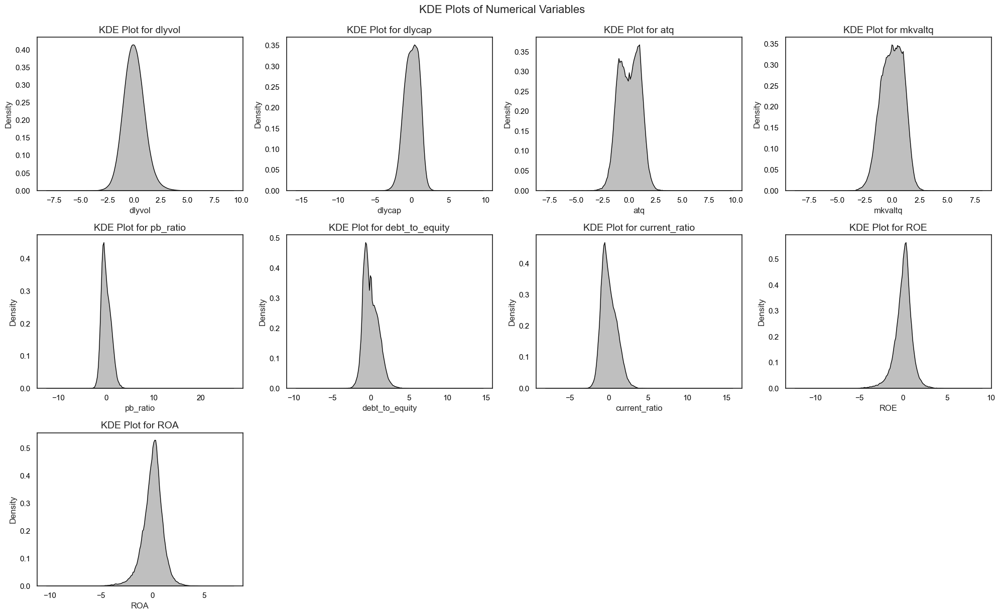

In [502]:
## Descriptive Statistics (Visual)

sampled_data = final[numvar].copy()

sns.set(style="white")

n_vars = len(numvar)
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))
axes = axes.flatten()

for i, col in enumerate(numvar):
    sns.kdeplot(sampled_data[col], shade=True, color="black", ax=axes[i])
    axes[i].set_title(f'KDE Plot for {col}', fontsize=14)
    axes[i].set_xlabel(col, fontsize=12)
    axes[i].set_ylabel('Density', fontsize=12)
    
    for spine in axes[i].spines.values():
        spine.set_visible(True)
    
    axes[i].tick_params(axis='both', which='major', length=6, width=1.5, colors='black')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
fig.suptitle('KDE Plots of Numerical Variables', y=1.02, fontsize=16)
plt.show()

In [496]:
## Correlation Analysis

final.drop(columns=identifyvar + datevar).corr()

,dlyret,dlyvol,dlycap,atq,mkvaltq,pb_ratio,debt_to_equity,current_ratio,ROE,ROA
dlyret,1.00,0.06,0.04,-0.01,0.03,0.03,0.00,0.00,0.01,0.01
dlyvol,0.06,1.00,0.06,0.13,0.06,-0.00,0.05,0.03,-0.00,0.00
dlycap,0.04,0.06,1.00,0.42,0.86,0.48,-0.13,0.10,0.19,0.21
atq,-0.01,0.13,0.42,1.00,0.39,-0.08,0.13,0.04,0.11,0.13
mkvaltq,0.03,0.06,0.86,0.39,1.00,0.61,-0.14,0.11,0.21,0.23
pb_ratio,0.03,-0.00,0.48,-0.08,0.61,1.00,0.10,-0.03,0.09,0.11
debt_to_equity,0.00,0.05,-0.13,0.13,-0.14,0.10,1.00,-0.21,-0.19,-0.17
current_ratio,0.00,0.03,0.10,0.04,0.11,-0.03,-0.21,1.00,0.10,0.11
ROE,0.01,-0.00,0.19,0.11,0.21,0.09,-0.19,0.10,1.00,0.87
ROA,0.01,0.00,0.21,0.13,0.23,0.11,-0.17,0.11,0.87,1.00


/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
/Users/chinmayma

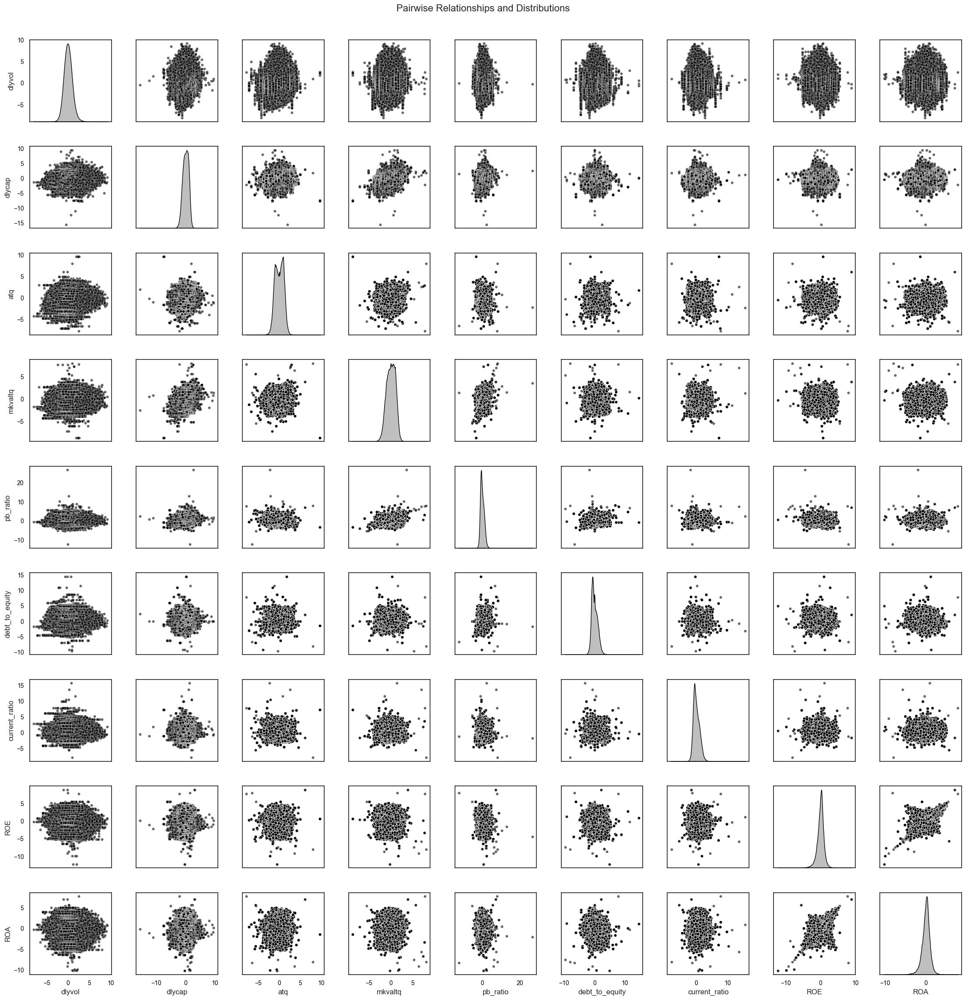

In [494]:
## Correlation Analysis

sampled_data = final.copy()

sns.set(style="white")

plt.rcParams.update({
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'font.size': 12
})

g = sns.pairplot(sampled_data[numvar], 
                 diag_kind="kde", 
                 kind="scatter", 
                 plot_kws={'color':'black', 'alpha':0.6, 's':20},
                 diag_kws={'shade':True, 'color':'black'})

for ax in g.axes.flatten():
    ax.spines['top'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.tick_params(axis='both', which='major', length=6, width=1.5, colors='black')

plt.subplots_adjust(wspace=0.3, hspace=0.3)
g.fig.suptitle('Pairwise Relationships and Distributions', y=1.02, fontsize=16)
plt.show()

### Model Training and Results

In [200]:
## Compare all combinations of Size and Profitability Features

import xgboost as xgb
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, train_test_split
from itertools import product

capitalization_features = ['atq', 'dlycap', 'mkvaltq']
profitability_features = ['ROE', 'ROA']
fixed_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'dlyvol']

def evaluate_combination(cap_feature, prof_feature, X_train, y_train, X_test, y_test, cv):

    X_subset_train = X_train[[cap_feature, prof_feature] + fixed_features]
    X_subset_test = X_test[[cap_feature, prof_feature] + fixed_features]

    # Create XGBoost model
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, tree_method='hist')

    # Perform cross-validation using time-series splits on training data
    cross_val_scores_mse = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    cross_val_scores_mae = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1)
    cross_val_scores_r2 = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='r2', n_jobs=-1)

    # Calculate the metrics for cross-validation
    mean_mse = -cross_val_scores_mse.mean()
    std_mse = cross_val_scores_mse.std()
    mean_mae = -cross_val_scores_mae.mean()
    std_mae = cross_val_scores_mae.std()
    mean_rmse = np.mean(np.sqrt(np.abs(cross_val_scores_mse)))
    std_rmse = np.std(np.sqrt(np.abs(cross_val_scores_mse)))
    mean_r2 = np.mean(cross_val_scores_r2)
    std_r2 = np.std(cross_val_scores_r2)

    print(f"Features: {cap_feature}, {prof_feature} + fixed features {fixed_features}")
    print(f"Cross-Validation MSE: Mean = {mean_mse}, Std = {std_mse}")
    print(f"Cross-Validation MAE: Mean = {mean_mae}, Std = {std_mae}")
    print(f"Cross-Validation RMSE: Mean = {mean_rmse}, Std = {std_rmse}")
    print(f"Cross-Validation R2: Mean = {mean_r2}, Std = {std_r2}")
    
    # Train on full training data and evaluate on the test set
    xgb_model.fit(X_subset_train, y_train)
    y_pred_test = xgb_model.predict(X_subset_test)
    
    mse_test = np.mean((y_test - y_pred_test) ** 2)
    mae_test = np.mean(np.abs(y_test - y_pred_test))
    rmse_test = np.sqrt(mse_test)
    r2_test = xgb_model.score(X_subset_test, y_test)
    
    print(f"Test Set Results: MSE = {mse_test}, MAE = {mae_test}, RMSE = {rmse_test}, R2 = {r2_test}")
    print('-' * 50)

# Assume final dataset is already prepared and 'dlyret' is the target variable
X = final.drop(columns=identifyvar + datevar + targetvar)
y = final['dlyret'].values.ravel()

# Split the data into train (70%) and test (30%) sets, respecting temporal order
train_size = int(len(X) * 0.7)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Use TimeSeriesSplit for cross-validation on training data
cv = TimeSeriesSplit(n_splits=5)

# Iterate over all combinations of capitalization and profitability features
for cap_feature, prof_feature in product(capitalization_features, profitability_features):
    evaluate_combination(cap_feature, prof_feature, X_train, y_train, X_test, y_test, cv)

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Features: atq, ROE + fixed features ['pb_ratio', 'debt_to_equity', 'current_ratio', 'dlyvol']
Cross-Validation MSE: Mean = 0.0022859229049453705, Std = 0.0006024002032440715
Cross-Validation MAE: Mean = 0.025777928665607082, Std = 0.003708191975458412
Cross-Validation RMSE: Mean = 0.04734749392225619, Std = 0.0066436228239781505
Cross-Validation R2: Mean = 0.00537618943820104, Std = 0.013900372795527556
Test Set Results: MSE = 0.0020419501948386143, MAE = 0.024714298903392228, RMSE = 0.04518794302508817, R2 = 0.018915873133505623
--------------------------------------------------
Features: atq, ROA + fixed features ['pb_ratio', 'debt_to_equity', 'current_ratio', 'dlyvol']
Cross-Validation MSE: Mean = 0.0022846160708130123, Std = 0.0005989330579423233
Cross-Validation MAE: Mean = 0.02577478737951943, Std = 0.0037071001312934337
Cross-Validation RMSE: Mean = 0.047340503440806585, Std = 0.006594907488660644
Cross-Validation R2: Mean = 0.005254354538168626, Std = 0.01741514160550663
Test S

        Features  CV MSE (mean)  CV MSE (std)  CV MAE (mean)  CV MAE (std)  \
0      atq & ROE        0.00229       0.00060        0.02578       0.00371   
1      atq & ROA        0.00228       0.00060        0.02577       0.00371   
2   dlycap & ROE        0.00229       0.00061        0.02579       0.00370   
3   dlycap & ROA        0.00231       0.00061        0.02579       0.00370   
4  mkvaltq & ROE        0.00229       0.00061        0.02578       0.00371   
5  mkvaltq & ROA        0.00229       0.00060        0.02578       0.00370   

   CV RMSE (mean)  CV RMSE (std)  CV R² (mean)  CV R² (std)  Test MSE  \
0         0.04735        0.00664       0.00538      0.01390   0.00204   
1         0.04734        0.00659       0.00525      0.01742   0.00205   
2         0.04740        0.00678       0.00406      0.00796   0.00207   
3         0.04755        0.00675      -0.00235      0.01221   0.00208   
4         0.04740        0.00669       0.00366      0.01327   0.00205   
5         0.047

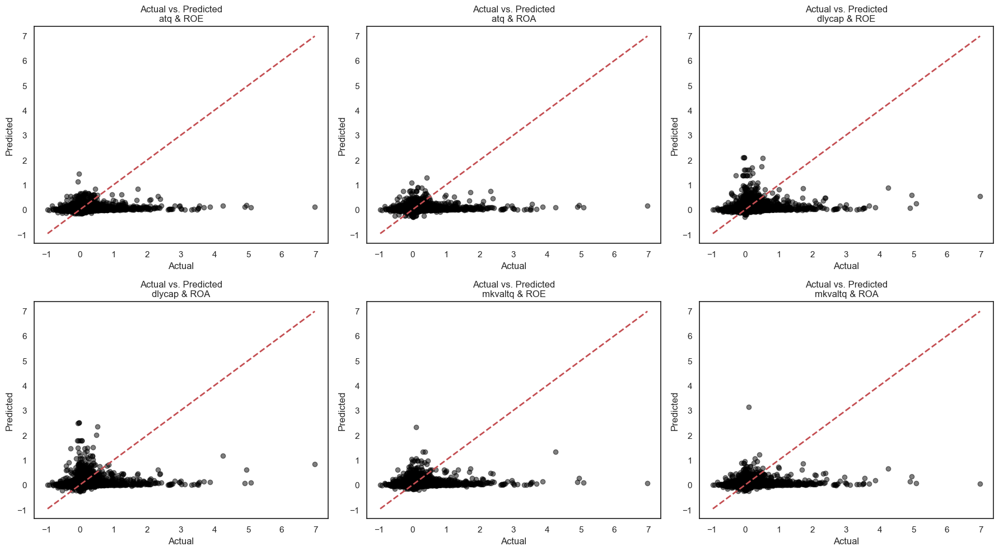

In [504]:
## Control Variable Selection Results

capitalization_features = ['atq', 'dlycap', 'mkvaltq']
profitability_features = ['ROE', 'ROA']
fixed_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'dlyvol']

def evaluate_combination_store(cap_feature, prof_feature, X_train, y_train, X_test, y_test, cv):
    X_subset_train = X_train[[cap_feature, prof_feature] + fixed_features]
    X_subset_test = X_test[[cap_feature, prof_feature] + fixed_features]

    xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, tree_method='hist')

    cross_val_scores_mse = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
    cross_val_scores_mae = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1)
    cross_val_scores_r2 = cross_val_score(xgb_model, X_subset_train, y_train, cv=cv, scoring='r2', n_jobs=-1)

    mean_mse = -cross_val_scores_mse.mean()
    std_mse = cross_val_scores_mse.std()
    mean_mae = -cross_val_scores_mae.mean()
    std_mae = cross_val_scores_mae.std()
    mean_rmse = np.mean(np.sqrt(np.abs(cross_val_scores_mse)))
    std_rmse = np.std(np.sqrt(np.abs(cross_val_scores_mse)))
    mean_r2 = np.mean(cross_val_scores_r2)
    std_r2 = np.std(cross_val_scores_r2)

    xgb_model.fit(X_subset_train, y_train)
    y_pred_test = xgb_model.predict(X_subset_test)

    mse_test = np.mean((y_test - y_pred_test) ** 2)
    mae_test = np.mean(np.abs(y_test - y_pred_test))
    rmse_test = np.sqrt(mse_test)
    r2_test = xgb_model.score(X_subset_test, y_test)

    return {
        'Features': f'{cap_feature} & {prof_feature}',
        'CV MSE (mean)': mean_mse,
        'CV MSE (std)': std_mse,
        'CV MAE (mean)': mean_mae,
        'CV MAE (std)': std_mae,
        'CV RMSE (mean)': mean_rmse,
        'CV RMSE (std)': std_rmse,
        'CV R² (mean)': mean_r2,
        'CV R² (std)': std_r2,
        'Test MSE': mse_test,
        'Test MAE': mae_test,
        'Test RMSE': rmse_test,
        'Test R²': r2_test,
        'y_test': y_test,
        'y_pred_test': y_pred_test
    }

def plot_results(results):
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for idx, result in enumerate(results):
        ax = axes[idx]
        y_test = result['y_test']
        y_pred_test = result['y_pred_test']
        ax.scatter(y_test, y_pred_test, alpha=0.5, color='black')
        ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
        ax.set_xlabel('Actual')
        ax.set_ylabel('Predicted')
        ax.set_title(f'Actual vs. Predicted\n{result["Features"]}')

    plt.tight_layout()
    plt.show()

X = final.drop(columns=identifyvar + datevar + targetvar)
y = final['dlyret'].values.ravel()
train_size = int(len(X) * 0.7)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]
cv = TimeSeriesSplit(n_splits=5)
results = []

for cap_feature, prof_feature in product(capitalization_features, profitability_features):
    result = evaluate_combination_store(cap_feature, prof_feature, X_train, y_train, X_test, y_test, cv)
    results.append(result)

results_df = pd.DataFrame(results).drop(columns=['y_test', 'y_pred_test'])
pd.set_option('display.float_format', '{:.5f}'.format)
print(results_df)
plot_results(results)

In [201]:
## Dropping the Unselected Columns and Displaying the Final Variables to be Used

final.drop(columns = ['dlycap', 'ROA', 'mkvaltq'], inplace = True)
final.head()

,dlycaldt,permno,ticker,primaryexch,dlyret,valid_gvkey,datadate,conm,dlyvol,atq,pb_ratio,debt_to_equity,current_ratio,ROE
0,2016-01-04,54594.0,AIR,N,-0.019019,1004.0,2016-02-29,AAR CORP,0.120892,-0.41045,-1.887967,-0.120163,-0.3234,-0.121625
1,2016-01-05,54594.0,AIR,N,-0.013959,1004.0,2016-02-29,AAR CORP,-1.018480,-0.41045,-1.887967,-0.120163,-0.3234,-0.121625
2,2016-01-06,54594.0,AIR,N,-0.030279,1004.0,2016-02-29,AAR CORP,-0.289736,-0.41045,-1.887967,-0.120163,-0.3234,-0.121625
3,2016-01-07,54594.0,AIR,N,-0.022709,1004.0,2016-02-29,AAR CORP,-0.031695,-0.41045,-1.887967,-0.120163,-0.3234,-0.121625
4,2016-01-08,54594.0,AIR,N,-0.024481,1004.0,2016-02-29,AAR CORP,0.607281,-0.41045,-1.887967,-0.120163,-0.3234,-0.121625


## Testing With News Data

In [203]:
## Import WRDS to get cloud connection

import wrds
import time
import pandas as pd
from joblib import Parallel, delayed
import numpy as np
from tqdm.auto import tqdm
import dask
import dask.dataframe as dd
import multiprocessing
import sqlite3 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import xgboost as xgb
from sklearn.model_selection import cross_val_score, RepeatedKFold
from sklearn.metrics import mean_squared_error, r2_score
import shap

In [204]:
## Establish or Close Connection

conn = wrds.Connection()
# conn.close()

WRDS recommends setting up a .pgpass file.
Created .pgpass file successfully.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done


In [609]:
## CRSP

dfs = []
start_time = time.time()
for year in range(2022, 2024):
    print(f"Fetching data for year: {year}")
    query = f"""
    SELECT  dlycaldt, permno, ticker, primaryexch, dlyret, dlyvol
    FROM crsp_a_stock.wrds_dsfv2_query
    WHERE DlyCalDt BETWEEN '{year}-01-01' AND '{year}-12-29' 
    AND SecurityEndDt >= '2023-01-01'
    AND SecInfoEndDt >= '2023-01-01'
    AND DlyRetMissFlg = 'NA'
    AND DlyprcFlg = 'TR'
    AND SecurityActiveFlg = 'Y'
    ORDER BY DlyCalDt
    """
    df = conn.raw_sql(query, date_cols=['DlyCalDt'])
    dfs.append(df)
    print(f"Finished fetching data for year: {year}")

dsf = pd.concat(dfs, ignore_index=True)
end_time = time.time()
print(f"Total time taken: {end_time - start_time} seconds")

sec = pd.DataFrame(dsf)

sec.to_csv('Latest Securities.csv')

Fetching data for year: 2022
Finished fetching data for year: 2022
Fetching data for year: 2023
Finished fetching data for year: 2023
Total time taken: 44.229751110076904 seconds


In [205]:
## COMPUSTAT

fundq = []
start_time = time.time()
for year in range(2022, 2024):
    print(f"Fetching data for year: {year}")
    query = f"""
    SELECT datadate, gvkey, conm, atq,
    dlttq, dlcq, teqq, actq, lctq, niq, prccq, cshoq 
    FROM comp_na_daily_all.fundq
    WHERE datadate BETWEEN '{year}-01-01' AND '{year}-12-31' 
    ORDER BY datadate
    """
    fund = conn.raw_sql(query, date_cols=['datadate'])
    fundq.append(fund)
    print(f"Finished fetching data for year: {year}")

fundq = pd.concat(fundq, ignore_index=True)
end_time = time.time()
print(f"Total time taken: {end_time - start_time} seconds")

fundfinal = pd.DataFrame(fundq)

fundfinal.to_csv('Latest Fundamentals.csv')

Fetching data for year: 2022
Finished fetching data for year: 2022
Fetching data for year: 2023
Finished fetching data for year: 2023
Total time taken: 2.8430919647216797 seconds


### Final Dataset Reading

In [206]:
## CRSP and Compustat

num_cores = multiprocessing.cpu_count()
print(f"Number of CPU cores: {num_cores}")

def process_data(chunk):
    return chunk

def parallel_read_csv(file_path, chunk_size=100000):
    start_time = time.time() 
    chunks = pd.read_csv(file_path, chunksize=chunk_size, low_memory=False)
    processed_chunks = Parallel(n_jobs=num_cores)(
        delayed(process_data)(chunk) for chunk in tqdm(chunks, desc="Processing", unit="chunk")
    )
    result_df = pd.concat(processed_chunks, axis=0)
    end_time = time.time()
    total_time = end_time - start_time
    print(f"Total time taken: {total_time:.2f} seconds")
    return result_df
 

sec_file_path = '/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Latest Securities.csv'
fund_file_path = '/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Latest Fundamentals.csv'

fund = parallel_read_csv(fund_file_path)
sec = parallel_read_csv(sec_file_path)

# fund = pd.read_csv('Fundamentals 7 Years.csv', low_memory = False)
# sec = pd.read_csv('Securities 7 Years.csv', low_memory = False)

Number of CPU cores: 10


Processing: 0chunk [00:00, ?chunk/s]

Total time taken: 0.28 seconds


Processing: 0chunk [00:00, ?chunk/s]

Total time taken: 2.70 seconds


In [207]:
## CCM

linkage = pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/Linkage 7 Years.csv')

In [208]:
## Checking the Loaded Data

print(f"The length of the sec dataset is {len(sec)}")
print(f"Number of unique columns in sec is {len(sec.columns)}")
print(f"Max Date in in sec is {max(sec['dlycaldt'])}")
print(f"Min Date in in sec is {min(sec['dlycaldt'])}")

print(f"The length of the fund dataset is {len(fund)}")
print(f"Number of unique columns in fund is {len(fund.columns)}")
print(f"Max Date in in fund is {max(fund['datadate'])}")
print(f"Min Date in in sec is {min(fund['datadate'])}")

print(f"The length of the linkage dataset is {len(linkage)}")
print(f"Number of unique columns in linkage is {len(linkage.columns)}")
print(f"Min Date in in linkage is {min(linkage['linkdt'])}")

The length of the sec dataset is 4351773
Number of unique columns in sec is 7
Max Date in in sec is 2023-12-29
Min Date in in sec is 2022-01-03
The length of the fund dataset is 97848
Number of unique columns in fund is 13
Max Date in in fund is 2023-12-31
Min Date in in sec is 2022-01-31
The length of the linkage dataset is 32495
Number of unique columns in linkage is 4
Min Date in in linkage is 1949-07-01


In [209]:
## Adding GVKEY to Securities Dataframe

sec['dlycaldt'] = pd.to_datetime(sec['dlycaldt'])
linkage['linkdt'] = pd.to_datetime(linkage['linkdt'])
linkage['linkenddt'] = pd.to_datetime(linkage['linkenddt'])
sec['permno'] = sec['permno'].astype('float')
linkage['permno'] = linkage['permno'].astype('float')

def preprocess_linkage(linkage, sec_dates):
    filtered_linkage = linkage[
        (linkage['linkenddt'].isna() & (linkage['linkdt'] <= sec_dates.max())) |
        ((linkage['linkdt'] <= sec_dates.max()) & (linkage['linkenddt'] >= sec_dates.min()))
    ]
    return filtered_linkage

def select_gvkey(row):
    if pd.isna(row['linkenddt']):
        if row['dlycaldt'] >= row['linkdt']:
            return row['gvkey']
    else:
        if row['linkdt'] <= row['dlycaldt'] <= row['linkenddt']:
            return row['gvkey']
    return None

def process_chunk(chunk, filtered_linkage):
    merged_chunk = pd.merge(chunk, filtered_linkage, on='permno', how='left')
    merged_chunk['selected_gvkey'] = merged_chunk.apply(select_gvkey, axis=1)
    return merged_chunk

def merge_sec_link_parallel(sec, linkage, n_jobs=10):
    sec_dates = sec['dlycaldt']
    filtered_linkage = preprocess_linkage(linkage, sec_dates)
    chunks = np.array_split(sec, n_jobs)
    processed_chunks = Parallel(n_jobs=n_jobs)(delayed(process_chunk)(chunk, filtered_linkage) for chunk in chunks)
    seclinked = pd.concat(processed_chunks, axis=0)
    seclinked['valid_gvkey'] = seclinked.apply(lambda row: select_gvkey(row) if pd.notnull(row['gvkey']) else None, axis=1)
    
    return seclinked

start_time = time.time()
seclinked = merge_sec_link_parallel(sec, linkage, n_jobs=10)
end_time = time.time()
print(f"Parallel processing took {end_time - start_time} seconds")
print(f"Original sec rows: {len(sec)}, Merged sec rows: {len(seclinked)}")
seclinked.head(5)

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Parallel processing took 28.34393286705017 seconds
Original sec rows: 4351773, Merged sec rows: 4359612


,Unnamed: 0,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,gvkey,linkdt,linkenddt,selected_gvkey,valid_gvkey
0,0,2022-01-03,10026.0,JJSF,Q,0.007344,145804.0,12825.0,1986-02-04,NaT,12825.0,12825.0
1,1,2022-01-03,10028.0,ELA,A,0.004914,28467.0,12096.0,1986-02-05,NaT,12096.0,12096.0
2,2,2022-01-03,10032.0,PLXS,Q,0.019710,95071.0,12945.0,1986-02-05,NaT,12945.0,12945.0
3,3,2022-01-03,10044.0,RMCF,Q,-0.006369,29614.0,11976.0,1986-02-11,NaT,11976.0,11976.0
4,4,2022-01-03,10065.0,ADX,N,0.007728,206820.0,1119.0,1982-01-29,NaT,1119.0,1119.0


In [210]:
## Checking the merged Securities Daily Dataset

seclinked = seclinked[seclinked['valid_gvkey'].notnull()]
seclinked['valid_gvkey'] = seclinked['valid_gvkey'].astype('float')

print(f"The length of the seclinked dataset is {len(seclinked)}")
print(f"Number of unique columns in seclinked is {len(seclinked.columns)}")
print(f"Max Date in in seclinked is {max(seclinked['dlycaldt'])}")
print(f"Min Date in in seclinked is {min(seclinked['dlycaldt'])}")

The length of the seclinked dataset is 2915985
Number of unique columns in seclinked is 12
Max Date in in seclinked is 2023-12-29 00:00:00
Min Date in in seclinked is 2022-01-03 00:00:00


In [211]:
## Comparing the companies present in both datasets

unique_sec_tickers = seclinked['valid_gvkey'].unique()
fund['gvkey'] = fund['gvkey'].astype('float')
unique_fund_tickers = fund['gvkey'].unique()
sec_tickers_set = set(unique_sec_tickers)
fund_tickers_set = set(unique_fund_tickers)

## Finding Common **(HIGH)**
common_tickers = sec_tickers_set.intersection(fund_tickers_set)
print(f"Common ticker symbols: {len(common_tickers)}")

## Finding ones missing in Compustat **(VERY LOW)**
unique_to_sec = sec_tickers_set.difference(fund_tickers_set)
print(f"Ticker symbols unique to sec DataFrame: {len(unique_to_sec)}")
 
## Finding ones missing in CRSP **(VERY HIGH)**
unique_to_fund = fund_tickers_set.difference(sec_tickers_set)
print(f"Ticker symbols unique to fund DataFrame: {len(unique_to_fund)}")

Common ticker symbols: 6066
Ticker symbols unique to sec DataFrame: 565
Ticker symbols unique to fund DataFrame: 7430


In [212]:
## Filtering both seclinked and fund datasets to only contain common gvkey's

fund = fund[fund['gvkey'].isin(common_tickers)]
seclinked = seclinked[seclinked['valid_gvkey'].isin(common_tickers)]

fund['datadate'] = pd.to_datetime(fund['datadate'])
fund['start_date'] = fund['datadate'] - pd.DateOffset(months=3) + pd.Timedelta(days=1)
fund['end_date'] = fund['datadate']

print(f"The length of the seclinked dataset is {len(seclinked)}")
print(f"Number of unique columns in seclinked is {len(seclinked.columns)}")
print(f"Number of unique gvkeys in seclinked is {seclinked['valid_gvkey'].nunique()}")

print(f"The length of the fund dataset is {len(fund)}")
print(f"Number of unique columns in fund is {len(fund.columns)}")
print(f"Number of unique gvkeys in fund is {fund['gvkey'].nunique()}")

The length of the seclinked dataset is 2760224
Number of unique columns in seclinked is 12
Number of unique gvkeys in seclinked is 6066
The length of the fund dataset is 47148
Number of unique columns in fund is 15
Number of unique gvkeys in fund is 6066


In [213]:
## Merging COMPUSTAT and CRSP Datasets 

def merge_and_filter_chunk(chunk, fund):
    merged = pd.merge(chunk, fund, left_on='valid_gvkey', right_on='gvkey', suffixes=('_sec', '_fund'))
    filtered = merged[(merged['dlycaldt'] >= merged['start_date']) & 
                      (merged['dlycaldt'] <= merged['datadate'])]
    return filtered

def process_chunks_in_parallel(seclinked, fund, chunk_size=20000, n_jobs=10):
    num_chunks = len(seclinked) // chunk_size + 1
    chunks = np.array_split(seclinked, num_chunks)
    results = Parallel(n_jobs=n_jobs)(
        delayed(merge_and_filter_chunk)(chunk, fund) 
        for chunk in tqdm(chunks, desc="Processing chunks", total=num_chunks)
    )
    final_df = pd.concat(results, axis=0).reset_index(drop=True)
    return final_df

start_time = time.time()
final_df = process_chunks_in_parallel(seclinked, fund, chunk_size=20000, n_jobs=10)
end_time = time.time()
print(f"Parallel processing took {end_time - start_time} seconds")

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Processing chunks:   0%|          | 0/139 [00:00<?, ?it/s]

Parallel processing took 5.332886695861816 seconds


In [214]:
## Validating the Final Merged DataFrame

print(f"The length of the final_df dataset is {len(final_df)}")
print(f"Number of unique columns in final_df is {len(final_df.columns)}")
print(f"Max Date in in final_df is {max(final_df['dlycaldt'])}")
print(f"Min Date in in final_df is {min(final_df['dlycaldt'])}")
print(f"Number of unique final_df in fund is {final_df['valid_gvkey'].nunique()}")

The length of the final_df dataset is 2714781
Number of unique columns in final_df is 27
Max Date in in final_df is 2023-12-29 00:00:00
Min Date in in final_df is 2022-01-03 00:00:00
Number of unique final_df in fund is 6053


In [215]:
## Fix Final Data Frame

final_df.drop(columns = ['Unnamed: 0_sec', 'Unnamed: 0_fund', 'gvkey_fund', 'gvkey_sec', 'selected_gvkey', 'end_date', 'linkdt', 'linkenddt', 'start_date'], inplace = True)

print(final_df.columns)
print(f"The total number of columns now are: {len(final_df.columns)}")

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'valid_gvkey', 'datadate', 'conm', 'atq', 'dlttq', 'dlcq', 'teqq',
       'actq', 'lctq', 'niq', 'prccq', 'cshoq'],
      dtype='object')
The total number of columns now are: 18


In [216]:
## Converting Wrongly detected datatypes

final_df['permno'] = final_df['permno'].astype('float')

## Checking % of NULL Values in Final_df

missing = final_df.isnull().mean() * 100
print(missing[missing > 0].sort_values(ascending=False))

actq      24.910223
lctq      24.883665
dlcq      15.799764
dlttq      9.339133
atq        8.581613
teqq       8.564558
niq        8.454273
prccq      6.397790
cshoq      2.169052
ticker     0.013077
dtype: float64


In [217]:
## Checking Null Value Effect

total_rows = final_df.shape[0]

# Number of rows with at least one null value
rows_with_nulls = final_df.isnull().any(axis=1).sum()

# Number of rows left after dropping rows with any null values
cleaned_df = pd.DataFrame(final_df.dropna())
rows_without_nulls = cleaned_df.shape[0]

# Display the results
print(f"Total number of rows: {total_rows}")
print(f"Number of rows with at least one null value: {rows_with_nulls}")
print(f"Number of rows after dropping rows with any null values: {rows_without_nulls}")
print(f"Number of unique gvkeys in cleaned_df is {cleaned_df['valid_gvkey'].nunique()}")

Total number of rows: 2714781
Number of rows with at least one null value: 752999
Number of rows after dropping rows with any null values: 1961782
Number of unique gvkeys in cleaned_df is 4699


In [218]:
## Dropping ALL rows with Null Values

final_new = pd.DataFrame(final_df.dropna())

In [219]:
## Validating Final's Data

print(f"The length of the final_new dataset is {len(final_new)}")
print(f"Number of unique columns in final_new is {len(final_new.columns)}")
print(f"Max Date in in final_new is {max(final_new['dlycaldt'])}")
print(f"Min Date in in final_new is {min(final_new['dlycaldt'])}")
print(f"Number of unique gvkeys in final_new is {final_new['valid_gvkey'].nunique()}")

The length of the final_new dataset is 1961782
Number of unique columns in final_new is 18
Max Date in in final_new is 2023-12-29 00:00:00
Min Date in in final_new is 2022-01-03 00:00:00
Number of unique gvkeys in final_new is 4699


In [220]:
## Checking for Duplicates

exact_duplicates = final_new[final_new.duplicated(keep=False)]
exact_duplicates.head(5)

,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,dlttq,dlcq,teqq,actq,lctq,niq,prccq,cshoq
2974,2022-01-03,13743.0,VTOL,N,0.046732,71163.0,8092.0,2022-03-31,BRISTOW GROUP INC,1824.279,638.350,82.625,835.368,579.885,287.755,-4.312,37.08,28.287
2975,2022-01-03,13743.0,VTOL,N,0.046732,71163.0,8092.0,2022-03-31,BRISTOW GROUP INC,1824.279,638.350,82.625,835.368,579.885,287.755,-4.312,37.08,28.287
4245,2022-01-03,76869.0,AEY,Q,-0.028902,143060.0,24428.0,2022-03-31,ADDVANTAGE TECHNOLOGIES GP,23.872,3.032,1.894,8.336,16.882,12.504,-1.393,1.39,13.189
4246,2022-01-03,76869.0,AEY,Q,-0.028902,143060.0,24428.0,2022-03-31,ADDVANTAGE TECHNOLOGIES GP,23.872,3.032,1.894,8.336,16.882,12.504,-1.393,1.39,13.189
8185,2022-01-04,13743.0,VTOL,N,0.009351,90743.0,8092.0,2022-03-31,BRISTOW GROUP INC,1824.279,638.350,82.625,835.368,579.885,287.755,-4.312,37.08,28.287


In [221]:
## Dropping Duplicates

final_new.drop_duplicates(inplace = True)
len(final_new)

1960993

In [222]:
## Feature Engineering in fund Dataframe and Dropping Redundant Columns ***

final_new['pb_ratio'] = final_new['prccq'] / (final_new['teqq'] / final_new['cshoq'])
final_new['debt_to_equity'] = (final_new['dlttq'] + final_new['dlcq']) / final_new['teqq']
final_new['current_ratio'] = final_new['actq'] / final_new['lctq']
final_new['ROE'] = final_new['niq'] / final_new['teqq']

final_new.drop(columns = ['prccq', 'teqq', 'dlcq', 'dlttq', 'actq', 'lctq', 'niq', 'cshoq'], inplace = True)

In [223]:
final_new.describe()

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


,dlycaldt,permno,dlyret,dlyvol,valid_gvkey,datadate,atq,pb_ratio,debt_to_equity,current_ratio,ROE
count,1960993,1.960993e+06,1.960993e+06,1.960993e+06,1.960993e+06,1960993,1.960993e+06,1.960993e+06,1.960993e+06,1.960993e+06,1.960993e+06
mean,2023-01-08 13:49:14.769750784,4.141131e+04,-2.832128e-04,1.668105e+06,6.392786e+04,2023-02-22 05:28:56.324199680,8.355262e+03,inf,inf,inf,inf
min,2022-01-03 00:00:00,1.002600e+04,-8.868780e-01,2.000000e+00,1.004000e+03,2022-01-31 00:00:00,5.500000e-02,-4.100512e+03,-1.672548e+03,3.723239e-03,-1.672600e+03
25%,2022-07-19 00:00:00,1.767200e+04,-1.978000e-02,8.365500e+04,2.198400e+04,2022-09-30 00:00:00,1.400980e+02,8.827216e-01,4.763720e-02,1.219001e+00,-1.047110e-01
50%,2023-01-12 00:00:00,2.162800e+04,-5.540000e-04,3.386610e+05,3.630100e+04,2023-03-31 00:00:00,7.426900e+02,1.808036e+00,3.602644e-01,2.028501e+00,1.133508e-03
75%,2023-07-06 00:00:00,7.961100e+04,1.712400e-02,1.110470e+06,6.518900e+04,2023-09-30 00:00:00,3.738103e+03,3.664228e+00,1.002219e+00,4.024801e+00,4.222025e-02
max,2023-12-29 00:00:00,9.343600e+04,3.972530e+01,1.923658e+09,3.534440e+05,2023-12-31 00:00:00,5.975730e+05,inf,inf,inf,inf
std,NaN,3.108832e+04,6.078846e-02,7.629170e+06,6.979224e+04,NaN,3.069464e+04,NaN,NaN,NaN,NaN


In [225]:
numerical_features = ['dlyvol', 'atq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE']

for feature in numerical_features:
    skewness = final_new[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of 'dlyvol': 41.062147450565
Skewness of 'atq': 8.476104052564063
Skewness of 'pb_ratio': nan
Skewness of 'debt_to_equity': nan
Skewness of 'current_ratio': nan
Skewness of 'ROE': nan


/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1256: RuntimeWarning: invalid value encountered in subtract
  adjusted = values - mean


In [226]:
## Based on the High Skewness and Outliers, We will remove Outliers from the data and keep Values between 1st and 99th Percentiles

percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
winsorize_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE']

for feature in winsorize_features:
    percentile_values = final_new[feature].quantile([p/100 for p in percentiles])
    print(f"Percentile values for {feature}:")
    print(percentile_values, '\n')

Percentile values for pb_ratio:
0.01   -31.327378
0.05    -2.003243
0.10     0.300984
0.25     0.882722
0.50     1.808036
0.75     3.664228
0.90     7.592617
0.95    12.834553
0.99    51.794015
Name: pb_ratio, dtype: float64 

Percentile values for debt_to_equity:
0.01   -13.613566
0.05    -1.797179
0.10     0.000000
0.25     0.047637
0.50     0.360264
0.75     1.002219
0.90     2.255185
0.95     3.994638
0.99    16.964186
Name: debt_to_equity, dtype: float64 

Percentile values for current_ratio:
0.01     0.241553
0.05     0.558761
0.10     0.779126
0.25     1.219001
0.50     2.028501
0.75     4.024801
0.90     8.911129
0.95    14.339801
0.99    31.448004
Name: current_ratio, dtype: float64 

Percentile values for ROE:
0.01   -2.745811
0.05   -0.615066
0.10   -0.313122
0.25   -0.104711
0.50    0.001134
0.75    0.042220
0.90    0.113632
0.95    0.280631
0.99    2.385938
Name: ROE, dtype: float64 



In [227]:
## Removing Outliers

print(f"The Initial description: {final_new.describe()}")

outlier_features = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE']

lower_bound = 0.01
upper_bound = 0.99

for feature in outlier_features:
    lower_quantile = final_new[feature].quantile(lower_bound)
    upper_quantile = final_new[feature].quantile(upper_bound)
    final_new = final_new[(final_new[feature] >= lower_quantile) & (final_new[feature] <= upper_quantile)]

print(f"The After Change description: {final_new.describe()}")

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


The Initial description:                             dlycaldt        permno        dlyret  \
count                        1960993  1.960993e+06  1.960993e+06   
mean   2023-01-08 13:49:14.769750784  4.141131e+04 -2.832128e-04   
min              2022-01-03 00:00:00  1.002600e+04 -8.868780e-01   
25%              2022-07-19 00:00:00  1.767200e+04 -1.978000e-02   
50%              2023-01-12 00:00:00  2.162800e+04 -5.540000e-04   
75%              2023-07-06 00:00:00  7.961100e+04  1.712400e-02   
max              2023-12-29 00:00:00  9.343600e+04  3.972530e+01   
std                              NaN  3.108832e+04  6.078846e-02   

             dlyvol   valid_gvkey                       datadate  \
count  1.960993e+06  1.960993e+06                        1960993   
mean   1.668105e+06  6.392786e+04  2023-02-22 05:28:56.324199680   
min    2.000000e+00  1.004000e+03            2022-01-31 00:00:00   
25%    8.365500e+04  2.198400e+04            2022-09-30 00:00:00   
50%    3.386610e+05  3

In [228]:
## Again Checking for Skewness

for feature in numerical_features:
    skewness = final_new[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of 'dlyvol': 40.74406926376494
Skewness of 'atq': 8.267822929113802
Skewness of 'pb_ratio': 2.8136694622958367
Skewness of 'debt_to_equity': 1.1473015222200142
Skewness of 'current_ratio': 2.86724560845181
Skewness of 'ROE': -2.1570757930093185


In [229]:
## Make RIC Value

conversionlogic = {
    'N' : '.N', 
    'Q' : '.O',
    'A' : '.A',
    'B' : '.Z'
}

final_new['RIC'] = final_new.apply(lambda row: row['ticker'] + conversionlogic.get(row['primaryexch'], ''), axis=1)
final_new.head()

,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,pb_ratio,debt_to_equity,current_ratio,ROE,RIC
0,2022-01-03,10026.0,JJSF,Q,0.007344,145804.0,12825.0,2022-03-31,J & J SNACK FOODS CORP,1123.328,3.498587,0.070250,3.525767,0.003848,JJSF.O
1,2022-01-03,10028.0,ELA,A,0.004914,28467.0,12096.0,2022-03-31,ENVELA CORP,59.759,4.144360,0.788803,4.329508,0.087432,ELA.A
2,2022-01-03,10032.0,PLXS,Q,0.019710,95071.0,12945.0,2022-03-31,PLEXUS CORP,2990.048,2.190241,0.434441,1.467614,0.025821,PLXS.O
3,2022-01-03,10044.0,RMCF,Q,-0.006369,29614.0,11976.0,2022-02-28,ROCKY MOUNTAIN CHOC FACT INC,26.881,2.503098,0.093505,2.823419,0.018505,RMCF.O
5,2022-01-03,10066.0,FKWL,Q,0.059497,150440.0,14112.0,2022-03-31,FRANKLIN WIRELESS CORP,57.182,1.067812,0.012550,3.898516,-0.017819,FKWL.O


## Textual Data Pre-processing

In [ ]:
## Loading Data
 
done1 = pd.read_csv('done1.csv')
done2 = pd.read_csv('done2.csv')
done3 = pd.read_csv('done3.csv')
done4 = pd.read_csv('done4.csv')
done5 = pd.read_csv('done5.csv')
esg = pd.read_csv('esg_data_combined.csv')

In [3]:
## done1, done2 (somewhat) and done3 need to be taken out again.

done2 = pd.DataFrame(done2[done2['storyText'].notnull()])

news = pd.concat([done2, done4, done5])

In [4]:
news.drop(columns = ['Unnamed: 0.1', 'Unnamed: 0', 'Unnamed: 0.2'], inplace = True)

news.head(5)

,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency
0,2023-11-14 19:01:50.052,UPDATE – Repligen Announces Publication of the...,urn:newsml:reuters.com:20231114:nGNX17ZlSJ:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0
1,2023-11-14 16:00:20.267,Publication of the Companys 2022 Sustainabilit...,urn:newsml:newsroom:20231114:nVMN6Bphva:0,NS:CMNW,RGEN.O,Publication of the Companys 2022 Sustainabilit...,['R:RGEN.O'],3.0
5,2023-11-14 12:30:00.146,Repligen Announces Publication of the Company’...,urn:newsml:reuters.com:20231114:nGNX749rqM:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0
7,2023-09-12 20:00:29.832,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230912:nVMN1SRnla:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,['R:SOVO.O'],3.0
8,2023-08-28 13:30:23.759,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230828:nVMNrnpTDa:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,"['R:CEQP.N', 'R:PRTK.O']",3.0


In [5]:
## Earlier 3315

news['cRIC'].nunique()

2501

In [18]:
esg.head(5)

,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score,cRIC
0,58.829332,45.382821,63.772355,68.565726,ROCK.O
1,71.212928,69.953013,80.411372,59.600597,XPRO.N
2,27.012986,37.125953,20.898116,31.763801,YETI.N
3,46.969013,31.494092,78.003234,24.887576,SPT.O
4,33.274879,6.413948,45.125836,52.353143,ZEUS.O


In [6]:
## Comparing the companies present in News and ESG datasets

news['cRIC'] = news['cRIC'].astype('object')
esg['cRIC'] = esg['cRIC'].astype('object')

newsric = news['cRIC'].unique()
esgric = esg['cRIC'].unique()
newsset = set(newsric)
esgset = set(esgric)

## Finding Common 
common1 = newsset.intersection(esgset)
print(f"Common RICs: {len(common1)}")

## Finding ones missing in ESG 
newsunique1 = newsset.difference(esgset)
print(f"RICs unique to News DataFrame: {len(newsunique1)}")
 
## Finding ones missing in News
esgunique = esgset.difference(newsset)
print(f"RICs unique to ESG DataFrame: {len(esgunique)}")

Common RICs: 1875
RICs unique to News DataFrame: 626
RICs unique to ESG DataFrame: 1314


In [7]:
news['versionCreated'] = pd.to_datetime(news['versionCreated'])
news['urgency'] = news['urgency'].astype('float')

In [8]:
news['dt'] = news['versionCreated'].dt.date

In [9]:
## Cleaning Story Text

def clean_story_text(text):
    text = text.replace('\n', ' ').replace('\r', ' ')
    text = re.sub(r'\s+', ' ', text).strip()
    text = text.encode('ascii', 'ignore').decode('ascii')
    return text

news['cleanedStoryText'] = news['storyText'].apply(clean_story_text)

news.head(5)

,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency,dt,cleanedStoryText
0,2023-11-14 19:01:50.052,UPDATE – Repligen Announces Publication of the...,urn:newsml:reuters.com:20231114:nGNX17ZlSJ:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...
1,2023-11-14 16:00:20.267,Publication of the Companys 2022 Sustainabilit...,urn:newsml:newsroom:20231114:nVMN6Bphva:0,NS:CMNW,RGEN.O,Publication of the Companys 2022 Sustainabilit...,['R:RGEN.O'],3.0,2023-11-14,Publication of the Companys 2022 Sustainabilit...
5,2023-11-14 12:30:00.146,Repligen Announces Publication of the Company’...,urn:newsml:reuters.com:20231114:nGNX749rqM:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...
7,2023-09-12 20:00:29.832,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230912:nVMN1SRnla:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,['R:SOVO.O'],3.0,2023-09-12,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...
8,2023-08-28 13:30:23.759,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230828:nVMNrnpTDa:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,"['R:CEQP.N', 'R:PRTK.O']",3.0,2023-08-28,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...


In [10]:
## Counting Tokens and Truncating to 1024 Max Length

tokenizer = BartTokenizer.from_pretrained("facebook/bart-large-cnn")

def truncate_and_count_tokens(text, max_length=1024):
    tokens = tokenizer(text, return_tensors='pt', truncation=True, max_length=max_length)
    truncated_text = tokenizer.decode(tokens['input_ids'][0], skip_special_tokens=True)
    token_count = len(tokens['input_ids'][0])
    return truncated_text, token_count

tqdm.pandas(desc="Processing")
news['truncated'], news['token_count'] = zip(*news['cleanedStoryText'].progress_apply(truncate_and_count_tokens))\
news.head()

Processing: 100%|██████████| 10600/10600 [02:11<00:00, 80.88it/s] 


,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency,dt,cleanedStoryText,truncated,token_count
0,2023-11-14 19:01:50.052,UPDATE – Repligen Announces Publication of the...,urn:newsml:reuters.com:20231114:nGNX17ZlSJ:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024
1,2023-11-14 16:00:20.267,Publication of the Companys 2022 Sustainabilit...,urn:newsml:newsroom:20231114:nVMN6Bphva:0,NS:CMNW,RGEN.O,Publication of the Companys 2022 Sustainabilit...,['R:RGEN.O'],3.0,2023-11-14,Publication of the Companys 2022 Sustainabilit...,Publication of the Companys 2022 Sustainabilit...,1024
5,2023-11-14 12:30:00.146,Repligen Announces Publication of the Company’...,urn:newsml:reuters.com:20231114:nGNX749rqM:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024
7,2023-09-12 20:00:29.832,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230912:nVMN1SRnla:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,['R:SOVO.O'],3.0,2023-09-12,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,613
8,2023-08-28 13:30:23.759,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230828:nVMNrnpTDa:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,"['R:CEQP.N', 'R:PRTK.O']",3.0,2023-08-28,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,773


## Topic and Subtopic Classification

In [5]:
import tensorflow as tf
from transformers import BertTokenizer, TFBertForSequenceClassification, pipeline
import pandas as pd
from tqdm.auto import tqdm

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    try:
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
        
        tf.config.experimental.set_virtual_device_configuration(
            physical_devices[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)]
        )
        print("GPU is enabled with limited memory usage.")
    except Exception as e:
        print("Error configuring GPU:", e)

with tf.device('/GPU:0'):
    model_name = 'yiyanghkust/finbert-esg-9-categories'
    finbert = TFBertForSequenceClassification.from_pretrained(model_name, num_labels=9, from_pt=True)
    tokenizer = BertTokenizer.from_pretrained(model_name)
    nlp = pipeline("text-classification", model=finbert, tokenizer=tokenizer)

def classify_text_pieces(text, nlp):
    max_length = 512
    predictions = []

    for i in range(0, len(text), max_length):
        piece = text[i:i + max_length]
        result = nlp(piece)
        predictions.extend(result)
        
    return predictions

def aggregate_predictions(predictions):
    categories = {}
    for prediction in predictions:
        label = prediction['label']
        score = prediction['score']
        if label in categories:
            categories[label] += score
        else:
            categories[label] = score
    
    total_scores = sum(categories.values())
    for category in categories:
        categories[category] /= total_scores
        
    max_category = max(categories, key=categories.get)
    confidence = categories[max_category]
    return max_category, confidence

def classify_text(row):
    try:
        token_count = row['token_count']
        text = row['truncated']

        if token_count > 512:
            predictions = classify_text_pieces(text, nlp)
        else:
            predictions = nlp(text[:512])
        
        category, confidence = aggregate_predictions(predictions)
        return pd.Series([category, confidence])
    except Exception as e:
        return pd.Series([str(e), None])

tqdm.pandas()
news[['Subtopic', 'Subtopic Score']] = news.progress_apply(classify_text, axis=1)
news.head(5)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertForSequenceClassification: ['bert.embeddings.position_ids']
- This IS expected if you are initializing TFBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertForSequenceClassification were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertForSequenceClassification for predictions without further training.
Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed t

  0%|          | 0/10600 [00:00<?, ?it/s]

## Sentiment Score Calculation

In [ ]:
## Ran in Azure ML

import tensorflow as tf
from transformers import BertTokenizer, BertForSequenceClassification, pipeline
import pandas as pd
from tqdm import tqdm

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    try:
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
        tf.config.experimental.set_virtual_device_configuration(
            physical_devices[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)]
        )
        print("GPU is enabled with limited memory usage.")
    except Exception as e:
        print("Error configuring GPU:", e)

with tf.device('/GPU:0'):
    model_name = 'yiyanghkust/finbert-tone'
    finbert = BertForSequenceClassification.from_pretrained(model_name, num_labels=3)
    tokenizer = BertTokenizer.from_pretrained(model_name)
    nlp = pipeline("sentiment-analysis", model=finbert, tokenizer=tokenizer)

def classify_text_pieces(text, nlp):
    max_length = 512 
    predictions = []

    for i in range(0, len(text), max_length):
        piece = text[i:i + max_length]
        result = nlp(piece)
        predictions.extend(result)
        
    return predictions

def aggregate_predictions(predictions):
    label_scores = {}
    
    for prediction in predictions:
        label = prediction['label']
        score = prediction['score']
        
        if label in label_scores:
            label_scores[label] += score
        else:
            label_scores[label] = score
    
    total_score = sum(label_scores.values())
    normalized_scores = {label: score / total_score for label, score in label_scores.items()}
    
    max_label = max(normalized_scores, key=normalized_scores.get)
    max_score = normalized_scores[max_label]
    
    return {'label': max_label, 'score': max_score}

def classify_text(row):
    try:
        token_count = row['token_count']
        text = row['truncated']
        
        if token_count > 512:
            predictions = classify_text_pieces(text, nlp)
        else:
            predictions = nlp(text[:512])
        
        aggregated_result = aggregate_predictions(predictions)
        return pd.Series([aggregated_result])
    except Exception as e:
        return pd.Series([str(e)])

tqdm.pandas()
news[['FinalResult']] = news.progress_apply(classify_text, axis=1)
news.head(5)

config.json:   0%|          | 0.00/533 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/439M [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/226k [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


  0%|          | 0/10 [00:00<?, ?it/s]

## Embeddings Generation for Semantic Information

In [ ]:
## Ran in Azure ML

import tensorflow as tf
from transformers import BertTokenizer, BertModel
import pandas as pd
import torch
from tqdm.auto import tqdm

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    try:
        tf.config.experimental.set_memory_growth(physical_devices[0], True)
        tf.config.experimental.set_virtual_device_configuration(
            physical_devices[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)]
        )
        print("GPU is enabled with limited memory usage.")
    except Exception as e:
        print("Error configuring GPU:", e)

model_name = 'yiyanghkust/finbert-esg-9-categories'
with tf.device('/GPU:0'):
    tokenizer = BertTokenizer.from_pretrained(model_name)
    model = BertModel.from_pretrained(model_name)

def extract_embeddings(text, tokenizer, model):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    cls_embeddings = outputs.last_hidden_state[:, 0, :].squeeze().numpy()
    return cls_embeddings

def embed_text(row):
    try:
        text = row['truncated']
        embeddings = extract_embeddings(text, tokenizer, model)
        return pd.Series([embeddings])
    except Exception as e:
        return pd.Series([str(e)])

tqdm.pandas()
news['Embeddings'] = news.progress_apply(embed_text, axis=1)
news.head(5)

  0%|          | 0/10 [00:00<?, ?it/s]

In [72]:
## Parsing FinalResult Column

def parse_final_result(final_result):
    try:
        result_dict = ast.literal_eval(final_result)
        sentiment = result_dict.get('label', None)
        sentiment_score = result_dict.get('score', None)
        return pd.Series([sentiment, sentiment_score])
    except (ValueError, SyntaxError):
        return pd.Series([None, None])

news[['Sentiment', 'Sentiment Score']] = news['FinalResult'].apply(parse_final_result)
news.head()

,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency,dt,cleanedStoryText,truncated,token_count,Category,Confidence,FinalResult,Embeddings,FLS_Label,FLS_Score,Sentiment,Sentiment Score
0,2023-11-14 19:01:50.052,UPDATE – Repligen Announces Publication of the...,urn:newsml:reuters.com:20231114:nGNX17ZlSJ:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024,Corporate Governance,0.500577,"{'label': 'Neutral', 'score': 0.7172140896650094}",[-1.10848196e-01 5.15475869e-01 3.59511465e-...,Not FLS,0.952076,Neutral,0.717214
1,2023-11-14 16:00:20.267,Publication of the Companys 2022 Sustainabilit...,urn:newsml:newsroom:20231114:nVMN6Bphva:0,NS:CMNW,RGEN.O,Publication of the Companys 2022 Sustainabilit...,['R:RGEN.O'],3.0,2023-11-14,Publication of the Companys 2022 Sustainabilit...,Publication of the Companys 2022 Sustainabilit...,1024,Climate Change,0.351454,"{'label': 'Neutral', 'score': 0.7236122960332565}",[-2.43309569e-02 1.31319821e-01 1.06167948e+...,Not FLS,0.976818,Neutral,0.723612
2,2023-11-14 12:30:00.146,Repligen Announces Publication of the Company’...,urn:newsml:reuters.com:20231114:nGNX749rqM:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024,Climate Change,0.591125,"{'label': 'Neutral', 'score': 0.5714897990115009}",[-1.02239139e-01 5.89338362e-01 3.71735543e-...,Not FLS,0.953591,Neutral,0.571490
3,2023-09-12 20:00:29.832,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230912:nVMN1SRnla:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,['R:SOVO.O'],3.0,2023-09-12,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,613,Corporate Governance,0.496776,"{'label': 'Neutral', 'score': 0.862106436301703}",[ 1.09020901e+00 1.26064980e+00 7.03309178e-...,Not FLS,0.952070,Neutral,0.862106
4,2023-08-28 13:30:23.759,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230828:nVMNrnpTDa:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,"['R:CEQP.N', 'R:PRTK.O']",3.0,2023-08-28,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,773,Corporate Governance,0.572953,"{'label': 'Neutral', 'score': 1.0}",[ 9.78119373e-01 4.64732647e-01 3.16779584e-...,Not FLS,0.712776,Neutral,1.000000


In [73]:
## Dropping Unnecessary Columns

news.drop(columns = ['FinalResult'], inplace=True)
news.columns

Index(['versionCreated', 'headline', 'storyId', 'sourceCode', 'cRIC',
       'storyText', 'RICs_mentioned', 'urgency', 'dt', 'cleanedStoryText',
       'truncated', 'token_count', 'Category', 'Confidence', 'Embeddings',
       'FLS_Label', 'FLS_Score', 'Sentiment', 'Sentiment Score'],
      dtype='object')

In [74]:
## Generating Extra Features

news.rename(columns = {'Category': 'Subtopic', 'Confidence': 'Subtopic Score', 'FLS_Label': 'FLS Label', 'FLS_Score': 'FLS Score'}, inplace=True)

,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency,dt,cleanedStoryText,truncated,token_count,Subtopic,Subtopic Score,Embeddings,FLS Label,FLS Score,Sentiment,Sentiment Score,Topic
0,2023-11-14 19:01:50.052,UPDATE – Repligen Announces Publication of the...,urn:newsml:reuters.com:20231114:nGNX17ZlSJ:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024,Corporate Governance,0.500577,[-1.10848196e-01 5.15475869e-01 3.59511465e-...,Not FLS,0.952076,Neutral,0.717214,Governance
1,2023-11-14 16:00:20.267,Publication of the Companys 2022 Sustainabilit...,urn:newsml:newsroom:20231114:nVMN6Bphva:0,NS:CMNW,RGEN.O,Publication of the Companys 2022 Sustainabilit...,['R:RGEN.O'],3.0,2023-11-14,Publication of the Companys 2022 Sustainabilit...,Publication of the Companys 2022 Sustainabilit...,1024,Climate Change,0.351454,[-2.43309569e-02 1.31319821e-01 1.06167948e+...,Not FLS,0.976818,Neutral,0.723612,Environmental
2,2023-11-14 12:30:00.146,Repligen Announces Publication of the Company’...,urn:newsml:reuters.com:20231114:nGNX749rqM:1,NS:GNW,RGEN.O,For best results when printing this announceme...,['R:RGEN.O'],3.0,2023-11-14,For best results when printing this announceme...,For best results when printing this announceme...,1024,Climate Change,0.591125,[-1.02239139e-01 5.89338362e-01 3.71735543e-...,Not FLS,0.953591,Neutral,0.571490,Environmental
3,2023-09-12 20:00:29.832,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230912:nVMN1SRnla:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,['R:SOVO.O'],3.0,2023-09-12,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,613,Corporate Governance,0.496776,[ 1.09020901e+00 1.26064980e+00 7.03309178e-...,Not FLS,0.952070,Neutral,0.862106,Governance
4,2023-08-28 13:30:23.759,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,urn:newsml:newsroom:20230828:nVMNrnpTDa:0,NS:CMNW,CLDX.O,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,"['R:CEQP.N', 'R:PRTK.O']",3.0,2023-08-28,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,SHAREHOLDER INVESTIGATION: Halper Sadeh LLC In...,773,Corporate Governance,0.572953,[ 9.78119373e-01 4.64732647e-01 3.16779584e-...,Not FLS,0.712776,Neutral,1.000000,Governance


In [493]:
news = pd.merge(news, esg, on = 'cRIC', how = 'left')

news.head(10)

## Joining ALL Data

In [230]:
## Read in the Fama French Factors Daily

ffm = pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/FFM.csv')

ffm['date'] = pd.to_datetime(ffm['date'])
ffm.head(5)

,date,mktrf,smb,hml,rmw,cma,rf,umd
0,2023-01-03,-0.0047,0.0005,-0.0013,0.0025,0.0053,0.00017,-0.0115
1,2023-01-04,0.0081,0.0056,0.0004,-0.0078,0.0000,0.00017,-0.0209
2,2023-01-05,-0.0114,0.0015,0.0121,0.0078,0.0080,0.00017,0.0122
3,2023-01-06,0.0221,-0.0001,0.0004,0.0085,0.0014,0.00017,-0.0009
4,2023-01-09,0.0004,0.0034,-0.0124,-0.0069,-0.0100,0.00017,-0.0203


In [231]:
news = pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/endingnews.csv')
news.drop(columns = ['Unnamed: 0'], inplace = True)
news['dt'] = pd.to_datetime(news['dt'])
news.head(5)

,versionCreated,headline,storyId,sourceCode,cRIC,storyText,RICs_mentioned,urgency,dt,cleanedStoryText,...,Sentiment Score,Topic,Cumulative Articles,Topic Wise Cumulative Articles,Days Since Last Article,Topic Wise Days Since Last Article,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score
0,2023-12-14 02:19:00.071,Alcoa Welcomes Decisions That Support Western ...,urn:newsml:reuters.com:20231214:nBw6rH83wa:1,NS:BSW,AA.N,For best results when printing this announceme...,"['R:AA.N', 'R:C}PB7309411427', 'R:C}PB73094114...",3.0,2023-12-14,For best results when printing this announceme...,...,0.742396,Non-ESG,1,1,0.0,0.0,87.512196,87.950651,81.515727,96.711289
1,2023-12-14 03:10:31.000,Alcoa of Australia Limited - Alcoa welcomes de...,urn:newsml:reuters.com:20231214:nNDL38FQ4K:1,NS:PUBT,AA.N,Alcoa today welcomed decisions from the Wester...,"['R:AA.N', 'R:C}PB7309411427', 'R:C}PB73094114...",3.0,2023-12-14,Alcoa today welcomed decisions from the Wester...,...,0.879627,Environmental,2,1,0.0,0.0,87.512196,87.950651,81.515727,96.711289
2,2023-12-18 04:50:41.965,Alcoa mines probe over plan to clear ancient f...,urn:newsml:newsroom:20231218:nNRAr5st3t:0,NS:AAP,AA.N,Alcoa mines probe over plan to clear ancient f...,['R:AA.N'],3.0,2023-12-18,Alcoa mines probe over plan to clear ancient f...,...,0.869798,Environmental,3,2,4.0,4.0,87.512196,87.950651,81.515727,96.711289
3,2023-12-18 07:04:12.939,Alcoa mines probe over plan to clear state forest,urn:newsml:newsroom:20231218:nNRAr5uwts:0,NS:AAP,AA.N,Alcoa mines probe over plan to clear state for...,['R:AA.N'],3.0,2023-12-18,Alcoa mines probe over plan to clear state for...,...,0.864254,Environmental,4,3,0.0,0.0,87.512196,87.950651,81.515727,96.711289
4,2023-12-19 00:00:00.000,Western Australia's EPA moves Alcoa's bauxite ...,urn:newsml:newsroom:20231225:nNRArarzyd:0,NS:METB,AA.N,Western Australia's EPA moves Alcoa's bauxite ...,['R:AA.N'],3.0,2023-12-19,Western Australia's EPA moves Alcoa's bauxite ...,...,0.881100,Environmental,5,4,1.0,1.0,87.512196,87.950651,81.515727,96.711289


In [426]:
print(list(news.groupby('Topic')['Subtopic'].unique()))

[array(['Natural Capital', 'Climate Change', 'Pollution & Waste'],
      dtype=object), array(['Business Ethics & Values', 'Corporate Governance'], dtype=object), array(['Non-ESG'], dtype=object), array(['Product Liability', 'Human Capital', 'Community Relations'],
      dtype=object)]


In [232]:
## Merging Stock data with FFM

final23 = pd.DataFrame(final_new[final_new['dlycaldt'] >= '2023-01-01'])

stockffm = pd.merge(final23, ffm, left_on = 'dlycaldt', right_on = 'date', how = 'left')

In [233]:
## Checking Differences in RIC in news and stockffm Data

news23 = pd.DataFrame(news[news['dt'] <= '2023-11-30'])

stockffm_rics = set(stockffm['RIC'].unique())
news_rics = set(news23['cRIC'].unique())

common_rics = stockffm_rics.intersection(news_rics)
stockffm_only_rics = stockffm_rics.difference(news_rics)
news_only_rics = news_rics.difference(stockffm_rics)

print(f"Number of RICs in stockffm: {len(stockffm_rics)}")
print(f"Number of RICs in news: {len(news_rics)}")
print(f"Number of common RICs: {len(common_rics)}")
print(f"Number of RICs only in stockffm: {len(stockffm_only_rics)}")
print(f"Number of RICs only in news: {len(news_only_rics)}")

Number of RICs in stockffm: 4485
Number of RICs in news: 2124
Number of common RICs: 1865
Number of RICs only in stockffm: 2620
Number of RICs only in news: 259


In [234]:
## Merging News and ESG Data to stockffm

overall = pd.merge(stockffm, news23, left_on = ['dlycaldt', 'RIC'], right_on = ['dt', 'cRIC'], how = 'left')

overall.head(5)

,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,Sentiment Score,Topic,Cumulative Articles,Topic Wise Cumulative Articles,Days Since Last Article,Topic Wise Days Since Last Article,ESG Score,Environmental Pillar Score,Social Pillar Score,Governance Pillar Score
0,2023-01-03,10026.0,JJSF,Q,0.011823,89954.0,12825.0,2023-03-31,J & J SNACK FOODS CORP,1224.957,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-03,10028.0,ELA,A,0.000000,26705.0,12096.0,2023-03-31,ENVELA CORP,73.742,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2023-01-03,10032.0,PLXS,Q,0.009132,123897.0,12945.0,2023-03-31,PLEXUS CORP,3382.020,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-01-03,10044.0,RMCF,Q,-0.006386,6332.0,11976.0,2023-02-28,ROCKY MOUNTAIN CHOC FACT INC,21.987,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023-01-03,10066.0,FKWL,Q,-0.033632,4424.0,14112.0,2023-03-31,FRANKLIN WIRELESS CORP,52.357,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [236]:
overall.drop(columns = ['FLS Label', 'FLS Score', 'Environmental Pillar Score', 'Social Pillar Score', 'Topic', 'Cumulative Articles',
'Topic Wise Cumulative Articles', 'Days Since Last Article', 'Topic Wise Days Since Last Article', 'Governance Pillar Score' ], inplace=True)
print(overall.columns)
print(len(overall.columns))

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'valid_gvkey', 'datadate', 'conm', 'atq', 'pb_ratio', 'debt_to_equity',
       'current_ratio', 'ROE', 'RIC', 'date', 'mktrf', 'smb', 'hml', 'rmw',
       'cma', 'rf', 'umd', 'versionCreated', 'headline', 'storyId',
       'sourceCode', 'cRIC', 'storyText', 'RICs_mentioned', 'urgency', 'dt',
       'cleanedStoryText', 'truncated', 'token_count', 'Subtopic',
       'Subtopic Score', 'Embeddings', 'Sentiment', 'Sentiment Score',
       'ESG Score'],
      dtype='object')
41


In [237]:
overall.dtypes

dlycaldt            datetime64[ns]
permno                     float64
ticker                      object
primaryexch                 object
dlyret                     float64
dlyvol                     float64
valid_gvkey                float64
datadate            datetime64[ns]
conm                        object
atq                        float64
pb_ratio                   float64
debt_to_equity             float64
current_ratio              float64
ROE                        float64
RIC                         object
date                datetime64[ns]
mktrf                      float64
smb                        float64
hml                        float64
rmw                        float64
cma                        float64
rf                         float64
umd                        float64
versionCreated              object
headline                    object
storyId                     object
sourceCode                  object
cRIC                        object
storyText           

In [36]:
## Checking Duplicates

print(f'The number of duplicate rows are: {overall.duplicated().sum()}')
print(f'The number of rows without deleting duplicates: {len(overall)}')

overall.drop_duplicates(inplace = True)
print(f'The number of rows after deleting duplicates: {len(overall)}')

The number of duplicate rows are: 2
The number of rows without deleting duplicates: 925127
The number of rows after deleting duplicates: 925125


In [37]:
## Checking Null Values

overall.isnull().sum()

dlycaldt                0
permno                  0
ticker                  0
primaryexch             0
dlyret                  0
dlyvol                  0
valid_gvkey             0
datadate                0
conm                    0
atq                     0
pb_ratio                0
debt_to_equity          0
current_ratio           0
ROE                     0
RIC                     0
date                    0
mktrf                   0
smb                     0
hml                     0
rmw                     0
cma                     0
rf                      0
umd                     0
storyId            919948
sourceCode         919948
urgency            919948
Subtopic           919948
Subtopic Score     919948
Embeddings         919948
Sentiment          919948
Sentiment Score    919948
ESG Score          921203
dtype: int64

In [38]:
len(overall)

925125

In [39]:
## Number of News Stories Left

len(overall[overall['storyId'].notnull()])

5177

In [242]:
overall.columns

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'valid_gvkey', 'datadate', 'conm', 'atq', 'pb_ratio', 'debt_to_equity',
       'current_ratio', 'ROE', 'RIC', 'date', 'mktrf', 'smb', 'hml', 'rmw',
       'cma', 'rf', 'umd', 'versionCreated', 'headline', 'storyId',
       'sourceCode', 'cRIC', 'storyText', 'RICs_mentioned', 'urgency', 'dt',
       'cleanedStoryText', 'truncated', 'token_count', 'Subtopic',
       'Subtopic Score', 'Embeddings', 'Sentiment', 'Sentiment Score',
       'ESG Score'],
      dtype='object')

In [40]:
overall.columns

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'valid_gvkey', 'datadate', 'conm', 'atq', 'pb_ratio', 'debt_to_equity',
       'current_ratio', 'ROE', 'RIC', 'date', 'mktrf', 'smb', 'hml', 'rmw',
       'cma', 'rf', 'umd', 'storyId', 'sourceCode', 'urgency', 'Subtopic',
       'Subtopic Score', 'Embeddings', 'Sentiment', 'Sentiment Score',
       'ESG Score'],
      dtype='object')

## Final Model Data Pre-Processing

In [41]:
## Dropping Unnecessary Columns

overall.drop(columns = ['versionCreated', 'headline', 'cRIC', 'storyText', 'RICs_mentioned', 'dt', 'cleanedStoryText', 'truncated', 'token_count'], inplace = True)

## Final Model Checking

In [27]:
## Re-Reading in Final Data

overall= pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/overalltousefinal 3.csv')
overall.drop(columns = ['Unnamed: 0', 'urgency', 'Subtopic Score', 'Sentiment Score', 'sourceCode'], inplace = True)
overall.head(5)

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1845388227.py:3: DtypeWarning: Columns (24,25,27,29,30) have mixed types. Specify dtype option on import or set low_memory=False.
  overall= pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/overalltousefinal 3.csv')


,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,hml,rmw,cma,rf,umd,storyId,Subtopic,Embeddings,Sentiment,ESG Score
0,2023-01-03,10026.0,JJSF,Q,0.011823,89954.0,12825.0,2023-03-31,J & J SNACK FOODS CORP,1224.957,...,-0.0013,0.0025,0.0053,0.00017,-0.0115,NaN,NaN,NaN,NaN,NaN
1,2023-01-03,10028.0,ELA,A,0.000000,26705.0,12096.0,2023-03-31,ENVELA CORP,73.742,...,-0.0013,0.0025,0.0053,0.00017,-0.0115,NaN,NaN,NaN,NaN,NaN
2,2023-01-03,10032.0,PLXS,Q,0.009132,123897.0,12945.0,2023-03-31,PLEXUS CORP,3382.020,...,-0.0013,0.0025,0.0053,0.00017,-0.0115,NaN,NaN,NaN,NaN,NaN
3,2023-01-03,10044.0,RMCF,Q,-0.006386,6332.0,11976.0,2023-02-28,ROCKY MOUNTAIN CHOC FACT INC,21.987,...,-0.0013,0.0025,0.0053,0.00017,-0.0115,NaN,NaN,NaN,NaN,NaN
4,2023-01-03,10066.0,FKWL,Q,-0.033632,4424.0,14112.0,2023-03-31,FRANKLIN WIRELESS CORP,52.357,...,-0.0013,0.0025,0.0053,0.00017,-0.0115,NaN,NaN,NaN,NaN,NaN


In [28]:
len(overall)

925127

In [29]:
## Get ESG Score for All Companies on All Dates

overall['ESG Score'] = overall.groupby('RIC')['ESG Score'].ffill().bfill()

In [30]:
## Converting Embeddings into a Machine Readable Format

def convert_embedding(embedding_str):
    try:
        if pd.notnull(embedding_str):
            embedding_str = embedding_str.strip('[]')
            embedding_str = embedding_str.replace('\n', ' ').replace('  ', ' ')
            embedding_list = embedding_str.split()
            embedding_list = list(map(float, embedding_list))
            return np.array(embedding_list, dtype=np.float32)
        else:
            return np.nan
    except Exception as e:
        print(f"Error converting embedding: {e}")
        return np.nan

overall['Embeddings'] = overall['Embeddings'].apply(convert_embedding)
len(overall)

925127

In [31]:
## Binary Indicator for Indicating when the Events Occured

overall['binary_indicator'] = overall['storyId'].notnull().astype(int)

In [32]:
## Using Event Study to Get Abnormal Returns for Each Window (Estimation - [-120,-7], Event - [-3,+3], Prediction - [+4,+30])

import statsmodels.api as sm 

overall['dlycaldt'] = pd.to_datetime(overall['dlycaldt'])

final_estimation_window_data = []
final_event_window_data = []
final_prediction_window_data = []

grouped = overall.groupby('RIC')

for name, group in grouped:
    group = group.sort_values('dlycaldt')
    event_dates = group[group['storyId'].notnull()]['dlycaldt'].drop_duplicates()
    available_dates = group['dlycaldt'].drop_duplicates().sort_values()

    for event_date in event_dates:
        event_window_before = available_dates[(available_dates <= event_date)].tail(4)
        event_window_after = available_dates[(available_dates > event_date)].head(3)

        if len(event_window_before) < 4 or len(event_window_after) < 3:
            continue

        event_window_dates = pd.concat([event_window_before, event_window_after])
        estimation_window_dates = available_dates[(available_dates < event_window_before.iloc[0])].tail(120)
        prediction_window_dates = available_dates[(available_dates > event_window_after.iloc[-1])].head(30)

        estimation_window_data = group[group['dlycaldt'].isin(estimation_window_dates)].copy()
        event_window_data = group[group['dlycaldt'].isin(event_window_dates)].copy()
        prediction_window_data = group[group['dlycaldt'].isin(prediction_window_dates)].copy()
        
        estimation_window_data['event_date'] = event_date
        estimation_window_data['RIC'] = name
        event_window_data['event_date'] = event_date
        event_window_data['RIC'] = name
        prediction_window_data['event_date'] = event_date
        prediction_window_data['RIC'] = name

        final_estimation_window_data.append(estimation_window_data)
        final_event_window_data.append(event_window_data)
        final_prediction_window_data.append(prediction_window_data)

estimation_window_data = pd.concat(final_estimation_window_data)
event_window_data = pd.concat(final_event_window_data)
prediction_window_data = pd.concat(final_prediction_window_data)

updated_estimation_window_data = []
updated_event_window_data = []
updated_prediction_window_data = []
problematic_cases = []

def calculate_expected_return(row, betas):
    factors = [1] + row[['mktrf', 'smb', 'hml', 'rmw', 'cma']].tolist()
    return np.dot(betas, factors)

for (event_date, RIC), group_event in event_window_data.groupby(['event_date', 'RIC']):
    group_estimation = estimation_window_data[(estimation_window_data['event_date'] == event_date) & 
                                              (estimation_window_data['RIC'] == RIC)]
    group_prediction = prediction_window_data[(prediction_window_data['event_date'] == event_date) & 
                                              (prediction_window_data['RIC'] == RIC)]
    
    if group_estimation.empty or group_event.empty or group_prediction.empty:
        continue
    
    X_estimation = group_estimation[['mktrf', 'smb', 'hml', 'rmw', 'cma']]
    X_estimation = sm.add_constant(X_estimation)
    y_estimation = group_estimation['dlyret'] - group_estimation['rf']

    if 'const' not in X_estimation.columns:
        print(f"Constant not added correctly for RIC: {RIC}, Event Date: {event_date}")
        problematic_cases.append((RIC, event_date))
        continue

    try:
        model_estimation = sm.OLS(y_estimation, X_estimation).fit()
        betas_estimation = model_estimation.params
    except Exception as e:
        print(f"Regression failed for RIC: {RIC}, Event Date: {event_date} with error: {e}")
        problematic_cases.append((RIC, event_date, str(e)))
        continue

    try:
        group_event['expected_return'] = group_event.apply(calculate_expected_return, axis=1, betas=betas_estimation)
        group_event['abnormal_return'] = group_event['dlyret'] - group_event['expected_return']
        group_estimation['expected_return'] = group_estimation.apply(calculate_expected_return, axis=1, betas=betas_estimation)
        group_estimation['abnormal_return'] = group_estimation['dlyret'] - group_estimation['expected_return']
        group_prediction['expected_return'] = group_prediction.apply(calculate_expected_return, axis=1, betas=betas_estimation)
        group_prediction['abnormal_return'] = group_prediction['dlyret'] - group_prediction['expected_return']
    except Exception as e:
        print(f"Error in expected return calculation for RIC: {RIC}, Event Date: {event_date} with error: {e}")
        problematic_cases.append((RIC, event_date, str(e)))
        continue
    
    updated_estimation_window_data.append(group_estimation)
    updated_event_window_data.append(group_event)
    updated_prediction_window_data.append(group_prediction)

final_estimation_window_data = pd.concat(updated_estimation_window_data)
final_event_window_data = pd.concat(updated_event_window_data)
final_prediction_window_data = pd.concat(updated_prediction_window_data)
final_data = pd.concat([final_estimation_window_data, final_event_window_data, final_prediction_window_data])
final_data = final_data.drop_duplicates(subset=['RIC', 'dlycaldt', 'event_date'])
final_data = final_data.sort_values(by=['RIC', 'event_date', 'dlycaldt'])

if problematic_cases:
    print(f"\nProblematic cases found: {len(problematic_cases)}")
    for case in problematic_cases:
        print(case)
else:
    print("No problematic cases detected.")

final_data.head(5)

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['expected_return'] = group_estimation.apply(calculate_expected_return, axis=1, betas=betas_estimation)
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['abnormal_return'] = group_estimation['dlyret'] - group_estimation['expected_return']
/var/folders/_w/ndnlj7653dv8frn

Constant not added correctly for RIC: CAVA.N, Event Date: 2023-06-23 00:00:00


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['expected_return'] = group_estimation.apply(calculate_expected_return, axis=1, betas=betas_estimation)
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['abnormal_return'] = group_estimation['dlyret'] - group_estimation['expected_return']
/var/folders/_w/ndnlj7653dv8frn

Constant not added correctly for RIC: DTI.O, Event Date: 2023-06-27 00:00:00


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['expected_return'] = group_estimation.apply(calculate_expected_return, axis=1, betas=betas_estimation)
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['abnormal_return'] = group_estimation['dlyret'] - group_estimation['expected_return']
/var/folders/_w/ndnlj7653dv8frn

Constant not added correctly for RIC: KITT.O, Event Date: 2023-10-06 00:00:00
Constant not added correctly for RIC: PZG.A, Event Date: 2023-10-06 00:00:00


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['expected_return'] = group_estimation.apply(calculate_expected_return, axis=1, betas=betas_estimation)
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1258202647.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_estimation['abnormal_return'] = group_estimation['dlyret'] - group_estimation['expected_return']
/var/folders/_w/ndnlj7653dv8frn


Problematic cases found: 4
('CAVA.N', Timestamp('2023-06-23 00:00:00'))
('DTI.O', Timestamp('2023-06-27 00:00:00'))
('KITT.O', Timestamp('2023-10-06 00:00:00'))
('PZG.A', Timestamp('2023-10-06 00:00:00'))


,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,umd,storyId,Subtopic,Embeddings,Sentiment,ESG Score,binary_indicator,event_date,expected_return,abnormal_return
205968,2023-03-23,14145.0,AAOI,Q,0.037975,84161.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,-0.0041,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.023249,0.014726
209668,2023-03-24,14145.0,AAOI,Q,-0.020325,52144.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,0.0033,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,-0.005308,-0.015017
212763,2023-03-27,14145.0,AAOI,Q,-0.286307,807578.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,0.0083,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.026465,-0.312772
217061,2023-03-28,14145.0,AAOI,Q,0.058140,493635.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,0.0075,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,-0.005466,0.063606
220765,2023-03-29,14145.0,AAOI,Q,0.005495,226515.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,-0.0109,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.065528,-0.060033


In [33]:
## Creating Indexing for Days Before & After Event to Identify

final_data = final_data.reset_index(drop=True)

def create_indexing(group):
    event_indices = group[group['event_date'] == group['dlycaldt']].index
    
    if not event_indices.empty:
        for event_index in event_indices:
            if 'indexing' not in group.columns or group.loc[event_index, 'indexing'] != '0':
                group['indexing'] = (group.index - event_index).astype(str)
                break
    
    return group

grandfinal = final_data.groupby(['RIC', 'event_date'], group_keys=False).apply(create_indexing)
grandfinal.head(5)

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1595345061.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grandfinal = final_data.groupby(['RIC', 'event_date'], group_keys=False).apply(create_indexing)


,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,storyId,Subtopic,Embeddings,Sentiment,ESG Score,binary_indicator,event_date,expected_return,abnormal_return,indexing
0,2023-03-23,14145.0,AAOI,Q,0.037975,84161.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.023249,0.014726,-123
1,2023-03-24,14145.0,AAOI,Q,-0.020325,52144.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,-0.005308,-0.015017,-122
2,2023-03-27,14145.0,AAOI,Q,-0.286307,807578.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.026465,-0.312772,-121
3,2023-03-28,14145.0,AAOI,Q,0.058140,493635.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,-0.005466,0.063606,-120
4,2023-03-29,14145.0,AAOI,Q,0.005495,226515.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,NaN,NaN,NaN,58.176392,0,2023-09-19,0.065528,-0.060033,-119


In [34]:
grandfinal.columns

Index(['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol',
       'valid_gvkey', 'datadate', 'conm', 'atq', 'pb_ratio', 'debt_to_equity',
       'current_ratio', 'ROE', 'RIC', 'date', 'mktrf', 'smb', 'hml', 'rmw',
       'cma', 'rf', 'umd', 'storyId', 'Subtopic', 'Embeddings', 'Sentiment',
       'ESG Score', 'binary_indicator', 'event_date', 'expected_return',
       'abnormal_return', 'indexing'],
      dtype='object')

In [36]:
## Checking Columns Skewness Before Changing Data Shape (Changed to dlyret)

for feature in [['dlyvol', 'atq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'abnormal_return']]:
    skewness = grandfinal[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of '['dlyvol', 'atq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'abnormal_return']': dlyvol              39.101045
atq                  9.592945
pb_ratio             3.018598
debt_to_equity       0.763127
current_ratio        2.681509
ROE                 -1.620150
abnormal_return    232.562982
dtype: float64


In [37]:
## Checking Distributions to Decide which Transformation to Apply

grandfinal.describe()

,dlycaldt,permno,dlyret,dlyvol,valid_gvkey,atq,pb_ratio,debt_to_equity,current_ratio,ROE,...,hml,rmw,cma,rf,umd,ESG Score,binary_indicator,event_date,expected_return,abnormal_return
count,595850,595850.000000,595850.000000,5.958500e+05,595850.000000,595850.000000,595850.000000,595850.000000,595850.000000,595850.000000,...,595850.000000,595850.000000,595850.000000,595850.000000,595850.000000,595850.000000,595850.000000,595850,595850.000000,595850.000000
mean,2023-07-07 18:01:05.178819840,33810.696890,0.000072,1.493721e+06,52951.793858,4733.611030,2.833060,0.633662,3.952885,-0.068742,...,-0.000356,0.000333,-0.000702,0.000193,-0.000166,40.384524,0.023320,2023-09-08 05:21:16.110429696,0.000086,-0.000015
min,2023-01-03 00:00:00,10145.000000,-0.877140,2.000000e+00,1050.000000,1.596000,-30.779947,-8.009827,0.252608,-1.684668,...,-0.035200,-0.013000,-0.016400,0.000160,-0.046500,4.260181,0.000000,2023-05-02 00:00:00,-2.792917,-3.979621
25%,2023-05-08 00:00:00,19197.000000,-0.018868,1.099335e+05,28093.000000,181.063000,0.847510,0.060722,1.291192,-0.124777,...,-0.005300,-0.003200,-0.004000,0.000180,-0.005600,23.021691,0.000000,2023-07-28 00:00:00,-0.009896,-0.016249
50%,2023-07-07 00:00:00,20902.000000,-0.000500,4.187230e+05,37510.000000,696.149000,1.754312,0.369253,2.143237,-0.011736,...,-0.000800,0.000500,-0.000900,0.000200,0.000900,39.795242,0.000000,2023-09-18 00:00:00,-0.000354,-0.000585
75%,2023-09-12 00:00:00,27334.000000,0.016162,1.186000e+06,39992.000000,3372.500000,3.532854,0.936617,4.507186,0.033479,...,0.004700,0.004100,0.001900,0.000210,0.005900,58.176392,0.000000,2023-11-03 00:00:00,0.009264,0.014360
max,2023-12-29 00:00:00,93289.000000,39.725302,6.960007e+08,352262.000000,384830.000000,51.443367,10.497914,30.958238,1.065282,...,0.022400,0.015100,0.014800,0.000220,0.022000,90.863115,1.000000,2023-11-30 00:00:00,3.972130,39.741553
std,NaN,26321.061561,0.078134,6.179048e+06,60046.908781,13136.517741,4.748253,1.502049,4.736991,0.252837,...,0.007565,0.005141,0.004709,0.000020,0.008682,19.504249,0.150917,NaN,0.026807,0.077413


In [38]:
## Applying Log Transformation to only Highly Skewed Features (Positive) and Cuberoot Transformation to Highly Skewed Features (Negative)

log_transform_columns = ['dlyvol', 'atq']
cuberoot_transform_columns = ['abnormal_return']

def transform_and_calculate_skewness(group):
    for col in log_transform_columns:
        group[col + '_log'] = np.log(group[col] + 1e-9)
    for col in cuberoot_transform_columns:
        group[col + '_cuberoot'] = np.cbrt(group[col])

    return group

grandfinal_transformed = grandfinal.groupby('RIC', group_keys=False).apply(transform_and_calculate_skewness)
grandfinal_transformed.head()

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/2730001882.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grandfinal_transformed = grandfinal.groupby('RIC', group_keys=False).apply(transform_and_calculate_skewness)


,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,Sentiment,ESG Score,binary_indicator,event_date,expected_return,abnormal_return,indexing,dlyvol_log,atq_log,abnormal_return_cuberoot
0,2023-03-23,14145.0,AAOI,Q,0.037975,84161.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.023249,0.014726,-123,11.340487,5.949473,0.245110
1,2023-03-24,14145.0,AAOI,Q,-0.020325,52144.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,-0.005308,-0.015017,-122,10.861764,5.949473,-0.246715
2,2023-03-27,14145.0,AAOI,Q,-0.286307,807578.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.026465,-0.312772,-121,13.601795,5.949473,-0.678801
3,2023-03-28,14145.0,AAOI,Q,0.058140,493635.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,-0.005466,0.063606,-120,13.109552,5.949473,0.399177
4,2023-03-29,14145.0,AAOI,Q,0.005495,226515.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.065528,-0.060033,-119,12.330566,5.949473,-0.391559


In [39]:
## Standardizing Columns to make performance Better

from sklearn.preprocessing import StandardScaler

def standardize_transformed_data(group):
    scaler = StandardScaler()
    log_transformed_cols = [col + '_log' for col in log_transform_columns]
    group[log_transformed_cols] = scaler.fit_transform(group[log_transformed_cols])
    cuberoot_transformed_cols = [col + '_cuberoot' for col in cuberoot_transform_columns]
    group[cuberoot_transformed_cols] = scaler.fit_transform(group[cuberoot_transformed_cols])
    additional_cols = ['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE']
    group[additional_cols] = scaler.fit_transform(group[additional_cols])
    
    return group

grandfinal_standardized = grandfinal_transformed.groupby('RIC', group_keys=False).apply(standardize_transformed_data)
grandfinal_standardized.head()

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/2526509699.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grandfinal_standardized = grandfinal_transformed.groupby('RIC', group_keys=False).apply(standardize_transformed_data)


,dlycaldt,permno,ticker,primaryexch,dlyret,dlyvol,valid_gvkey,datadate,conm,atq,...,Sentiment,ESG Score,binary_indicator,event_date,expected_return,abnormal_return,indexing,dlyvol_log,atq_log,abnormal_return_cuberoot
0,2023-03-23,14145.0,AAOI,Q,0.037975,84161.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.023249,0.014726,-123,-2.044237,0.93088,0.697112
1,2023-03-24,14145.0,AAOI,Q,-0.020325,52144.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,-0.005308,-0.015017,-122,-2.400328,0.93088,-0.601329
2,2023-03-27,14145.0,AAOI,Q,-0.286307,807578.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.026465,-0.312772,-121,-0.362197,0.93088,-1.742056
3,2023-03-28,14145.0,AAOI,Q,0.058140,493635.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,-0.005466,0.063606,-120,-0.728345,0.93088,1.103855
4,2023-03-29,14145.0,AAOI,Q,0.005495,226515.0,18564.0,2023-03-31,APPLIED OPTOELECTRONICS INC,383.551,...,NaN,58.176392,0,2023-09-19,0.065528,-0.060033,-119,-1.307781,0.93088,-0.983722


In [40]:
print(list(grandfinal_standardized.columns))

['dlycaldt', 'permno', 'ticker', 'primaryexch', 'dlyret', 'dlyvol', 'valid_gvkey', 'datadate', 'conm', 'atq', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'RIC', 'date', 'mktrf', 'smb', 'hml', 'rmw', 'cma', 'rf', 'umd', 'storyId', 'Subtopic', 'Embeddings', 'Sentiment', 'ESG Score', 'binary_indicator', 'event_date', 'expected_return', 'abnormal_return', 'indexing', 'dlyvol_log', 'atq_log', 'abnormal_return_cuberoot']


In [41]:
## Checking Columns Skewness Again

for feature in [['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'dlyvol_log', 'atq_log', 'abnormal_return_cuberoot']]:
    skewness = grandfinal_standardized[feature].skew()
    print(f"Skewness of '{feature}': {skewness}")

Skewness of '['pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'dlyvol_log', 'atq_log', 'abnormal_return_cuberoot']': pb_ratio                    0.181110
debt_to_equity              0.150305
current_ratio               0.060445
ROE                        -0.117903
dlyvol_log                  0.768123
atq_log                    -0.001439
abnormal_return_cuberoot    0.063336
dtype: float64


In [42]:
## Converting DataFrame into Machine Readible Format for Time-Series Modeling (AR) (** Removed Subtopic and Sentiment Scores **)

resultss = pd.DataFrame()

columns_to_compute = ['dlyvol_log', 'atq_log', 'pb_ratio', 'debt_to_equity', 'current_ratio', 'ROE', 'abnormal_return_cuberoot']

def process_group(group):
    result = {}
    result['RIC'] = group['RIC'].iloc[0]
    result['dlycaldt'] = group[group['indexing'] == '0']['dlycaldt'].iloc[0]
    result['event_date'] = group[group['indexing'] == '0']['event_date'].iloc[0]

    assert result['dlycaldt'] == result['event_date']

    specific_indices = ['-3']

    for column in columns_to_compute:
        for idx in specific_indices:
            if idx == str(group['indexing'].astype(int).min()):
                prefix = f"index_min_{column}_"
            else:
                prefix = f"index_{idx}_{column}_"

            if idx in group['indexing'].values:
                row = group[group['indexing'] == idx].iloc[0]
                result[f'{prefix}value'] = row[column]
            else:
                result[f"{prefix}value"] = float('nan')


    for day in [4,15,30]:
        prefix = f"index_{day}_abnormal_return_"
        if str(day) in group['indexing'].values:
            row = group[group['indexing'] == str(day)].iloc[0]
            result[f'{prefix}value'] = row['abnormal_return_cuberoot']
        else:
            result[f"{prefix}value"] = float('nan')

    news_row = group[group['indexing'] == '0'].iloc[0]
    result['Subtopic'] = news_row['Subtopic']
    result['Embeddings'] = news_row['Embeddings']
    result['Sentiment'] = news_row['Sentiment']
    result['ESG Score'] = news_row['ESG Score']

    return result

resultss = grandfinal_standardized.groupby(['RIC', 'event_date'], group_keys=False).apply(process_group).apply(pd.Series).reset_index(drop=True)
resultss.head()

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1782975494.py:47: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  resultss = grandfinal_standardized.groupby(['RIC', 'event_date'], group_keys=False).apply(process_group).apply(pd.Series).reset_index(drop=True)


,RIC,dlycaldt,event_date,index_-3_dlyvol_log_value,index_-3_atq_log_value,index_-3_pb_ratio_value,index_-3_debt_to_equity_value,index_-3_current_ratio_value,index_-3_ROE_value,index_-3_abnormal_return_cuberoot_value,index_4_abnormal_return_value,index_15_abnormal_return_value,index_30_abnormal_return_value,Subtopic,Embeddings,Sentiment,ESG Score
0,AAOI.O,2023-09-19,2023-09-19,0.687333,0.155656,0.006966,0.189084,-0.468176,0.937688,1.085219,-0.998694,-0.868419,0.717828,Non-ESG,"[-0.6701098, -0.37942094, 0.3711601, -1.704891...",Neutral,16.428907
1,AAOI.O,2023-09-21,2023-09-21,0.650765,0.155656,0.006966,0.189084,-0.468176,0.937688,-0.425049,0.840760,0.609920,1.170840,Corporate Governance,"[0.8440335, 1.3467466, 0.47959888, -0.6437769,...",Neutral,16.428907
2,AAOI.O,2023-10-02,2023-10-02,0.291825,0.155656,0.006966,0.189084,-0.468176,0.937688,0.903427,-0.920009,0.808153,1.441789,Non-ESG,"[-0.7204549, -0.13255723, 0.42919183, -1.66536...",Neutral,16.428907
3,AAOI.O,2023-10-03,2023-10-03,0.389547,0.155656,0.006966,0.189084,-0.468176,0.937688,1.181359,-1.456318,0.821187,0.925696,Non-ESG,"[-0.6673229, -0.0038896329, 0.23909545, -1.686...",Neutral,16.428907
4,AAOI.O,2023-10-23,2023-10-23,-0.028348,1.369573,1.514849,-1.627939,1.726015,0.328317,1.020850,-0.722572,1.451826,-0.878541,Business Ethics & Values,"[0.95154965, 1.1847571, 0.43016315, -0.5555654...",Neutral,16.428907


In [43]:
assert len(resultss) == len(grandfinal_standardized[grandfinal_standardized['indexing'] == '0']), "The number of rows in results does not match the number of rows in grandfinal where indexing = 0"

In [44]:
## Checking Null Values

pd.set_option('display.max_rows', None)
print(resultss.isnull().sum())

RIC                                          0
dlycaldt                                     0
event_date                                   0
index_-3_dlyvol_log_value                    0
index_-3_atq_log_value                       0
index_-3_pb_ratio_value                      0
index_-3_debt_to_equity_value                0
index_-3_current_ratio_value                 0
index_-3_ROE_value                           0
index_-3_abnormal_return_cuberoot_value      0
index_4_abnormal_return_value                0
index_15_abnormal_return_value              72
index_30_abnormal_return_value             546
Subtopic                                     0
Embeddings                                   0
Sentiment                                    0
ESG Score                                    0
dtype: int64


In [45]:
## Removing Events with Null Values for Target Variables to Cross Validate

resultss = resultss.dropna(subset=['index_15_abnormal_return_value', 'index_30_abnormal_return_value'])

In [46]:
## Checking Null Values Again

pd.set_option('display.max_rows', None)
print(resultss.isnull().sum().sum())

0


In [47]:
# Encoding Categorical Variables

resultss['Subtopic'] = resultss['Subtopic'].astype(str)
resultss['Sentiment'] = resultss['Sentiment'].astype(str)

resultss = pd.get_dummies(resultss, columns=['Subtopic', 'Sentiment'], drop_first=True)

In [48]:
print(list(resultss.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'Embeddings', 'ESG Score', 'Subtopic_Climate Change', 'Subtopic_Community Relations', 'Subtopic_Corporate Governance', 'Subtopic_Human Capital', 'Subtopic_Natural Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution & Waste', 'Subtopic_Product Liability', 'Sentiment_Neutral', 'Sentiment_Positive']


In [49]:
# results = pd.read_csv('/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/modelinput.csv')
# results.drop(columns = ['Unnamed: 0'], inplace = True)
resultss.head(5)

,RIC,dlycaldt,event_date,index_-3_dlyvol_log_value,index_-3_atq_log_value,index_-3_pb_ratio_value,index_-3_debt_to_equity_value,index_-3_current_ratio_value,index_-3_ROE_value,index_-3_abnormal_return_cuberoot_value,...,Subtopic_Climate Change,Subtopic_Community Relations,Subtopic_Corporate Governance,Subtopic_Human Capital,Subtopic_Natural Capital,Subtopic_Non-ESG,Subtopic_Pollution & Waste,Subtopic_Product Liability,Sentiment_Neutral,Sentiment_Positive
0,AAOI.O,2023-09-19,2023-09-19,0.687333,0.155656,0.006966,0.189084,-0.468176,0.937688,1.085219,...,False,False,False,False,False,True,False,False,True,False
1,AAOI.O,2023-09-21,2023-09-21,0.650765,0.155656,0.006966,0.189084,-0.468176,0.937688,-0.425049,...,False,False,True,False,False,False,False,False,True,False
2,AAOI.O,2023-10-02,2023-10-02,0.291825,0.155656,0.006966,0.189084,-0.468176,0.937688,0.903427,...,False,False,False,False,False,True,False,False,True,False
3,AAOI.O,2023-10-03,2023-10-03,0.389547,0.155656,0.006966,0.189084,-0.468176,0.937688,1.181359,...,False,False,False,False,False,True,False,False,True,False
4,AAOI.O,2023-10-23,2023-10-23,-0.028348,1.369573,1.514849,-1.627939,1.726015,0.328317,1.020850,...,False,False,False,False,False,False,False,False,True,False


In [50]:
resultss.columns = resultss.columns.str.replace(' ', '_')
results_sorted = resultss.sort_values(by='dlycaldt')
print(list(resultss.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'Embeddings', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive']


In [51]:
##  Aggregating Embeddings using PCA to make them more Readable

from sklearn.decomposition import PCA

embeddings_df = pd.DataFrame(resultss['Embeddings'].tolist())
embeddings_df.columns = [f'embedding_{i}' for i in range(embeddings_df.shape[1])]
embedding_columns = [f'embedding_{i}' for i in range(768)]
combined_df = pd.concat([resultss.drop(columns=['Embeddings']), embeddings_df], axis=1)
combined_df.head(5)

,RIC,dlycaldt,event_date,index_-3_dlyvol_log_value,index_-3_atq_log_value,index_-3_pb_ratio_value,index_-3_debt_to_equity_value,index_-3_current_ratio_value,index_-3_ROE_value,index_-3_abnormal_return_cuberoot_value,...,embedding_758,embedding_759,embedding_760,embedding_761,embedding_762,embedding_763,embedding_764,embedding_765,embedding_766,embedding_767
0,AAOI.O,2023-09-19,2023-09-19,0.687333,0.155656,0.006966,0.189084,-0.468176,0.937688,1.085219,...,1.010098,1.081046,1.444775,-0.668394,-1.245443,0.754358,-1.317162,-1.768432,-0.245737,-0.736827
1,AAOI.O,2023-09-21,2023-09-21,0.650765,0.155656,0.006966,0.189084,-0.468176,0.937688,-0.425049,...,-0.387335,1.764111,0.379262,0.231536,1.209050,0.120837,-0.228054,-0.593071,-1.395254,1.382113
2,AAOI.O,2023-10-02,2023-10-02,0.291825,0.155656,0.006966,0.189084,-0.468176,0.937688,0.903427,...,0.798155,1.399739,0.991575,-0.320123,-0.643201,0.771746,-1.273140,-1.476142,-0.417818,-0.370903
3,AAOI.O,2023-10-03,2023-10-03,0.389547,0.155656,0.006966,0.189084,-0.468176,0.937688,1.181359,...,0.942961,1.206783,0.957415,-0.527425,-1.099346,0.535823,-1.362496,-1.703688,-0.409633,-0.562460
4,AAOI.O,2023-10-23,2023-10-23,-0.028348,1.369573,1.514849,-1.627939,1.726015,0.328317,1.020850,...,-0.257392,1.688286,0.381805,-0.072644,1.525676,-0.250775,-0.076852,-0.908856,-1.298893,1.155944


In [52]:
combined_df.isnull().sum()

RIC                                        467
dlycaldt                                   467
event_date                                 467
index_-3_dlyvol_log_value                  467
index_-3_atq_log_value                     467
index_-3_pb_ratio_value                    467
index_-3_debt_to_equity_value              467
index_-3_current_ratio_value               467
index_-3_ROE_value                         467
index_-3_abnormal_return_cuberoot_value    467
index_4_abnormal_return_value              467
index_15_abnormal_return_value             467
index_30_abnormal_return_value             467
ESG_Score                                  467
Subtopic_Climate_Change                    467
Subtopic_Community_Relations               467
Subtopic_Corporate_Governance              467
Subtopic_Human_Capital                     467
Subtopic_Natural_Capital                   467
Subtopic_Non-ESG                           467
Subtopic_Pollution_&_Waste                 467
Subtopic_Prod

In [53]:
combined_df.dropna(inplace = True)

In [54]:
print(list(combined_df.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 'embedding_0', 'embedding_1', 'embedding_2', 'embedding_3', 'embedding_4', 'embedding_5', 'embedding_6', 'embedding_7', 'embedding_8', 'embedding_9', 'embedding_10', 'embedding_11', 'embedding_12', 'embedding_13', 'embedding_14', 'embedding_15', 'embedding_16', 'embedding_17', 'embedding_18', 'embedding_19', 'embedding_20', 'embedding_21', 'embedding_22', 'embedding_23

In [55]:
## PCA for Embeddings to reduce Dimensionality

embeddings_pca = PCA()
embeddings_pca_result = embeddings_pca.fit_transform(combined_df[embedding_columns])
explained_variance_embeddings = embeddings_pca.explained_variance_ratio_
n_components_to_keep = np.argmax(np.cumsum(explained_variance_embeddings) >= 0.90) + 1
print(f"Number of components to keep for 90% explained variance: {n_components_to_keep}")

Number of components to keep for 90% explained variance: 17


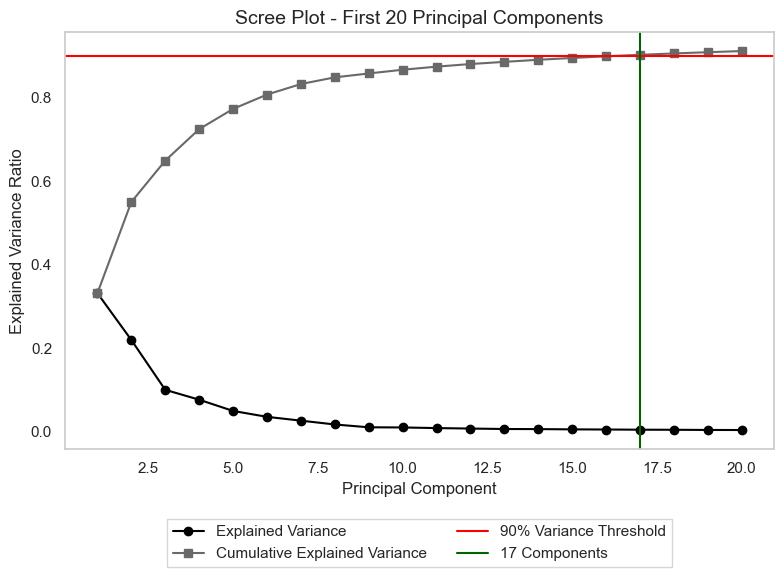

In [56]:
## Visualising PCA Results using Scree Plot

import matplotlib.pyplot as plt
import numpy as np

explained_variance_embeddings = np.array(explained_variance_embeddings)
cumulative_explained_variance = np.cumsum(explained_variance_embeddings)

plt.figure(figsize=(8, 6))
plt.plot(range(1, 21), explained_variance_embeddings[:20], marker='o', linestyle='-', color='black', label='Explained Variance')
plt.plot(range(1, 21), cumulative_explained_variance[:20], marker='s', linestyle='-', color='dimgray', label='Cumulative Explained Variance')
plt.axhline(y=0.9, color='red', linestyle='-', label='90% Variance Threshold')
plt.axvline(x=17, color='darkgreen', linestyle='-', label='17 Components') 
plt.title('Scree Plot - First 20 Principal Components', fontsize=14)
plt.xlabel('Principal Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.grid(False)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=False, shadow=False, ncol=2)
plt.tight_layout()
plt.show()


In [57]:
## Checking which original feature relates the most to the Top 17 Principal Components Used

loadings = embeddings_pca.components_
loadings_df = pd.DataFrame(loadings.T, index=embedding_columns, columns=[f'PC{i+1}' for i in range(loadings.shape[0])])
print(loadings_df)

                    PC1       PC2       PC3       PC4       PC5       PC6  \
embedding_0   -0.032814  0.044863 -0.028715 -0.006380  0.060917 -0.031395   
embedding_1   -0.035416  0.027845 -0.000452  0.028859  0.059739 -0.061466   
embedding_2   -0.002118  0.014301 -0.012656 -0.001029 -0.010104  0.043661   
embedding_3   -0.019061  0.010803  0.021915 -0.062899  0.041864  0.036020   
embedding_4    0.004090  0.047203 -0.003827 -0.009298  0.025345 -0.034399   
embedding_5    0.013090  0.067977 -0.017595 -0.014900 -0.021969 -0.013251   
embedding_6   -0.010476 -0.010622  0.076105 -0.022862  0.036817 -0.012533   
embedding_7    0.024341 -0.011085  0.005110 -0.012560 -0.030571  0.041476   
embedding_8   -0.007859 -0.025715  0.078054 -0.004826  0.002041  0.005900   
embedding_9   -0.025012  0.035920 -0.030901  0.010601 -0.001591  0.014057   
embedding_10  -0.019505  0.017668 -0.034872  0.074586  0.043374 -0.006856   
embedding_11  -0.047004 -0.006661 -0.006185  0.082476  0.015719  0.011982   

In [58]:
# Show top 3 absolute loadings for Top 17 Selected PCs

top_n = 3
for pc in loadings_df.columns[:17]:
    print(f"Top {top_n} features contributing to {pc}:")
    print(loadings_df[pc].abs().nlargest(top_n))
    print()

Top 3 features contributing to PC1:
embedding_456    0.113703
embedding_382    0.110359
embedding_157    0.109172
Name: PC1, dtype: float32

Top 3 features contributing to PC2:
embedding_46     0.120124
embedding_59     0.111470
embedding_171    0.107204
Name: PC2, dtype: float32

Top 3 features contributing to PC3:
embedding_544    0.120494
embedding_524    0.107588
embedding_106    0.107126
Name: PC3, dtype: float32

Top 3 features contributing to PC4:
embedding_255    0.111875
embedding_73     0.111614
embedding_741    0.100052
Name: PC4, dtype: float32

Top 3 features contributing to PC5:
embedding_308    0.284886
embedding_612    0.109278
embedding_405    0.103893
Name: PC5, dtype: float32

Top 3 features contributing to PC6:
embedding_308    0.171793
embedding_449    0.117136
embedding_442    0.116959
Name: PC6, dtype: float32

Top 3 features contributing to PC7:
embedding_103    0.120662
embedding_242    0.107176
embedding_241    0.105578
Name: PC7, dtype: float32

Top 3 feature

In [59]:
print(list(combined_df.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 'embedding_0', 'embedding_1', 'embedding_2', 'embedding_3', 'embedding_4', 'embedding_5', 'embedding_6', 'embedding_7', 'embedding_8', 'embedding_9', 'embedding_10', 'embedding_11', 'embedding_12', 'embedding_13', 'embedding_14', 'embedding_15', 'embedding_16', 'embedding_17', 'embedding_18', 'embedding_19', 'embedding_20', 'embedding_21', 'embedding_22', 'embedding_23

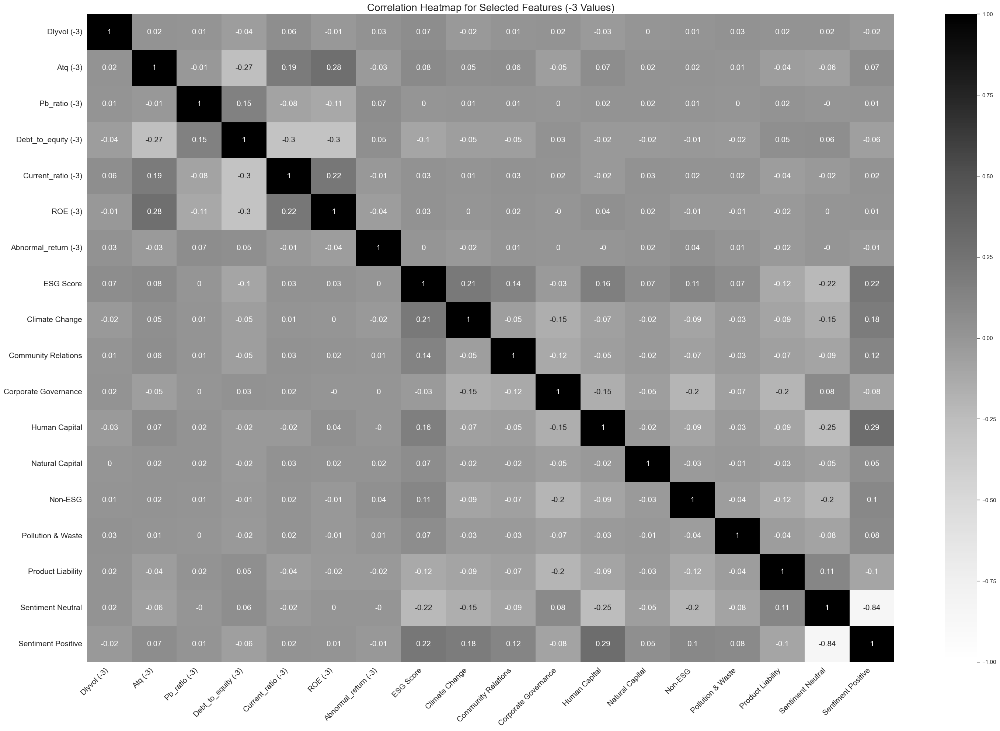

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

columns_of_interest_minus_3 = ['index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 
'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 
'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 
'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive']

new_feature_names_minus_3 = [
    'Dlyvol (-3)', 'Atq (-3)', 'Pb_ratio (-3)', 'Debt_to_equity (-3)', 
    'Current_ratio (-3)', 'ROE (-3)', 'Abnormal_return (-3)', 
    'ESG Score', 'Climate Change', 'Community Relations', 
    'Corporate Governance', 'Human Capital', 'Natural Capital', 
    'Non-ESG', 'Pollution & Waste', 'Product Liability', 
    'Sentiment Neutral', 'Sentiment Positive'
]

feature_name_mapping_minus_3 = dict(zip(columns_of_interest_minus_3, new_feature_names_minus_3))
corr_matrix_minus_3 = combined_df[columns_of_interest_minus_3].corr()
corr_matrix_minus_3.rename(columns=feature_name_mapping_minus_3, index=feature_name_mapping_minus_3, inplace=True)
formatted_corr_matrix_minus_3 = corr_matrix_minus_3.round(2)

plt.figure(figsize=(30, 20))
sns.heatmap(formatted_corr_matrix_minus_3, annot=True, cmap="Greys", vmin=-1, vmax=1, annot_kws={"size": 15})
plt.xticks(rotation=45, ha="right", fontsize=15)
plt.yticks(fontsize=15)
plt.title('Correlation Heatmap for Selected Features (-3 Values)', fontsize=20)
plt.tight_layout()
plt.grid(False)
plt.show()

In [247]:
## Final Concatenation of PCA generated 17 PC's and Lagged Financial Features

pca_columns = [f'PC{i+1}' for i in range(n_components_to_keep)]
pca_df = pd.DataFrame(embeddings_pca_result[:, :n_components_to_keep], columns=pca_columns)
combined_df_reset = combined_df.reset_index(drop=True)
pca_df_reset = pca_df.reset_index(drop=True)
X_combined = pd.concat([combined_df_reset.drop(columns=embedding_columns), pca_df_reset], axis=1)

## Linear Regression for Hypotheses Testing

In [248]:
X_combined.describe()

,dlycaldt,event_date,index_-3_dlyvol_log_value,index_-3_atq_log_value,index_-3_pb_ratio_value,index_-3_debt_to_equity_value,index_-3_current_ratio_value,index_-3_ROE_value,index_-3_abnormal_return_cuberoot_value,index_4_abnormal_return_value,...,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
count,3118,3118,3118.000000,3118.000000,3118.000000,3118.000000,3118.000000,3.118000e+03,3118.000000,3118.000000,...,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03,3.118000e+03
mean,2023-08-28 14:08:23.399615232,2023-08-28 14:08:23.399615232,0.036577,-0.029522,-0.073012,0.013288,-0.165944,-6.231401e-02,-0.013294,-0.004275,...,7.340662e-08,-6.851285e-08,-3.976192e-08,7.585351e-08,2.936265e-08,-2.936265e-08,-2.446887e-09,2.446887e-08,-6.117218e-09,3.303298e-08
min,2023-05-02 00:00:00,2023-05-02 00:00:00,-3.138299,-2.933780,-2.927891,-3.537551,-3.057189,-3.292234e+00,-2.696801,-2.582392,...,-9.981583e+00,-1.001546e+01,-8.721262e+00,-7.220212e+00,-6.021846e+00,-5.726684e+00,-8.439517e+00,-7.576583e+00,-7.724975e+00,-4.441649e+00
25%,2023-07-14 00:00:00,2023-07-14 00:00:00,-0.630233,-0.858125,-0.923075,-0.769109,-0.981685,-9.296148e-01,-0.950817,-0.941577,...,-7.758014e-01,-5.189113e-01,-6.214660e-01,-4.508885e-01,-5.421270e-01,-6.587617e-01,-3.796331e-01,-4.776656e-01,-3.623479e-01,-4.244590e-01
50%,2023-09-05 00:00:00,2023-09-05 00:00:00,-0.074636,-0.048077,-0.174238,0.000000,-0.256054,-1.387779e-17,-0.349526,-0.314177,...,-6.801148e-03,-7.757633e-02,-5.734762e-02,-1.422038e-01,7.618119e-02,3.129558e-02,-8.315311e-02,-9.712632e-03,-5.681125e-02,1.601673e-02
75%,2023-10-27 00:00:00,2023-10-27 00:00:00,0.600766,0.809567,0.797681,0.849148,0.651454,7.728013e-01,0.963188,0.968829,...,8.413193e-01,4.626062e-01,6.736013e-01,8.008960e-01,7.590832e-01,3.726260e-01,4.220325e-01,3.983656e-01,3.142809e-01,3.603443e-01
max,2023-11-15 00:00:00,2023-11-15 00:00:00,6.121414,3.413453,3.180354,3.571637,3.545573,3.517873e+00,3.926246,3.538169,...,9.845882e+00,1.637329e+01,1.181967e+01,8.165068e+00,6.107296e+00,6.673738e+00,7.687528e+00,7.043989e+00,5.966821e+00,6.006768e+00
std,NaN,NaN,0.994131,0.992381,0.971276,0.982868,0.964395,9.897603e-01,1.024073,1.020975,...,2.545235e+00,1.939080e+00,1.898678e+00,1.729634e+00,1.592491e+00,1.448415e+00,1.416337e+00,1.323767e+00,1.271054e+00,1.196455e+00


In [249]:
print(list(X_combined.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17']


In [63]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

features_minus_3 = ['index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17']
y_targets = ['index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value']

ols_results_minus_3 = {}

for target in y_targets:
    print(f"\nRunning OLS for {target} with '-3' values\n")

    y_ols = X_combined[target]
    X_ols = X_combined[features_minus_3].copy()
    X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
    X_ols = X_ols.apply(pd.to_numeric, errors='coerce')
    y_ols = pd.to_numeric(y_ols, errors='coerce')
    X_ols = sm.add_constant(X_ols)

    model_ols = sm.OLS(y_ols, X_ols).fit()
    ols_results_minus_3[target] = model_ols

    print("OLS Results:")
    print(model_ols.summary())



Running OLS for index_4_abnormal_return_value with '-3' values

OLS Results:
                                  OLS Regression Results                                 
Dep. Variable:     index_4_abnormal_return_value   R-squared:                       0.015
Model:                                       OLS   Adj. R-squared:                  0.004
Method:                            Least Squares   F-statistic:                     1.320
Date:                           Thu, 29 Aug 2024   Prob (F-statistic):             0.0992
Time:                                   17:00:04   Log-Likelihood:                -4465.3
No. Observations:                           3118   AIC:                             9003.
Df Residuals:                               3082   BIC:                             9220.
Df Model:                                     35                                         
Covariance Type:                       nonrobust                                         
                      

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/2074006460.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/2074006460.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/2074006460.py:20: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))


OLS Results:
                                  OLS Regression Results                                  
Dep. Variable:     index_30_abnormal_return_value   R-squared:                       0.012
Model:                                        OLS   Adj. R-squared:                  0.001
Method:                             Least Squares   F-statistic:                     1.046
Date:                            Thu, 29 Aug 2024   Prob (F-statistic):              0.394
Time:                                    17:00:04   Log-Likelihood:                -4398.4
No. Observations:                            3118   AIC:                             8869.
Df Residuals:                                3082   BIC:                             9086.
Df Model:                                      35                                         
Covariance Type:                        nonrobust                                         
                                              coef    std err          t     

/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1466765055.py:66: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1466765055.py:66: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/1466765055.py:66: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))


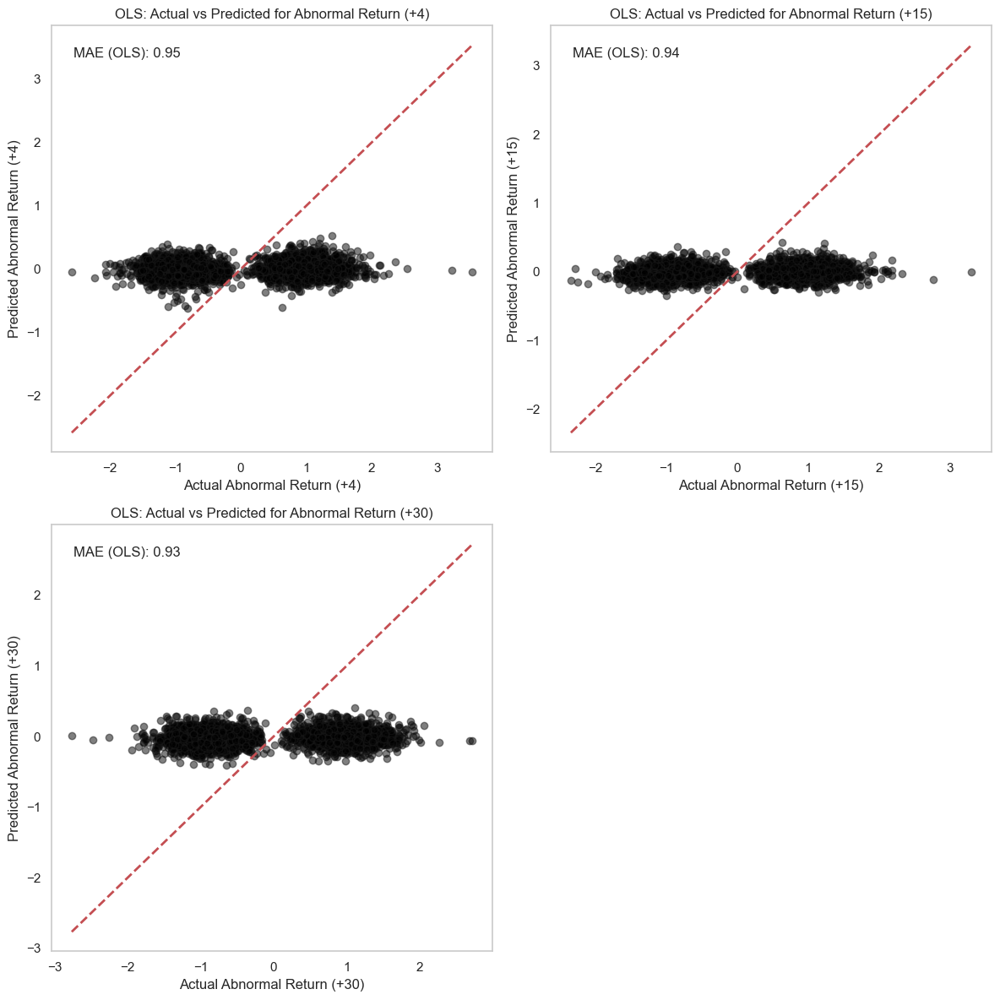

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error

features_minus_3 = [
    'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 
    'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 
    'index_-3_abnormal_return_cuberoot_value', 'ESG_Score', 'Subtopic_Climate_Change', 
    'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 
    'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 
    'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 
    'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 
    'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17'
]

y_targets = [
    'index_4_abnormal_return_value', 
    'index_15_abnormal_return_value', 
    'index_30_abnormal_return_value'
]

new_feature_names = [
    'Dlyvol (-3)', 'Atq (-3)', 'Pb_ratio (-3)', 'Debt_to_equity (-3)', 
    'Current_ratio (-3)', 'ROE (-3)', 'Abnormal_return (-3)',
    'ESG Score', 'Subtopic Climate Change', 'Subtopic Community Relations', 
    'Subtopic Corporate Governance', 'Subtopic Human Capital', 
    'Subtopic Natural Capital', 'Subtopic Non-ESG', 'Subtopic Pollution & Waste', 
    'Subtopic Product Liability', 'Sentiment Neutral', 'Sentiment Positive', 
    'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 
    'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17'
]

feature_name_mapping = dict(zip(features_minus_3, new_feature_names))

new_target_names = [
    'Abnormal Return (+4)', 
    'Abnormal Return (+15)', 
    'Abnormal Return (+30)'
]

target_name_mapping = dict(zip(y_targets, new_target_names))
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
axs = axs.flatten()
fig.delaxes(axs[-1])

for i, target in enumerate(y_targets):
    new_target_name = target_name_mapping[target]

    y_ols = X_combined[target]
    X_ols = X_combined[features_minus_3].copy()
    X_ols = X_ols.applymap(lambda x: 1 if x is True else (0 if x is False else x))
    X_ols = X_ols.apply(pd.to_numeric, errors='coerce')
    y_ols = pd.to_numeric(y_ols, errors='coerce')\
    X_ols = sm.add_constant(X_ols)

    model_ols = sm.OLS(y_ols, X_ols).fit()
    predictions_ols = model_ols.predict(X_ols)
    mae_ols = mean_absolute_error(y_ols, predictions_ols)

    ax = axs[i]
    ax.scatter(y_ols, predictions_ols, alpha=0.5, edgecolors='k', color='black')
    
    min_val = min(y_ols.min(), predictions_ols.min())
    max_val = max(y_ols.max(), predictions_ols.max())
    ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2)
    
    ax.set_xlabel(f'Actual {new_target_name}')
    ax.set_ylabel(f'Predicted {new_target_name}')
    ax.set_title(f'OLS: Actual vs Predicted for {new_target_name}')
    
    ax.text(0.05, 0.95, f'MAE (OLS): {mae_ols:.2f}', 
            ha='left', va='top', transform=ax.transAxes, 
            fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
    
    ax.grid(False)

plt.tight_layout()
plt.show()


## Model Comparison Using TimeSeriesSplit Cross Validation

In [68]:
## Converting Ctaegorical Columns to Numeric

boolean_columns = ['Sentiment_Neutral', 'Sentiment_Positive', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability']
X_combined[boolean_columns] = X_combined[boolean_columns].applymap(lambda x: 1 if x is True else 0)


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/9548351.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  X_combined[boolean_columns] = X_combined[boolean_columns].applymap(lambda x: 1 if x is True else 0)


In [69]:
## Regularising with CV

import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
import lightgbm as lgb

models = {
    'RandomForest': RandomForestRegressor(max_depth= 5, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 200),
    'LightGBM': lgb.LGBMRegressor(num_leaves=31, max_depth=5, learning_rate=0.05, n_estimators=200, min_child_samples=20, subsample=0.8, colsample_bytree=0.8, reg_alpha=0.1, reg_lambda=0.1, random_state=42),
    'MLP': MLPRegressor(hidden_layer_sizes=(100,), activation='relu', solver='adam', alpha=0.0001, learning_rate='constant', learning_rate_init=0.001, max_iter=200, random_state=42)
}

cv = TimeSeriesSplit(n_splits=5)

def adjusted_r2(r2, n, p):
    return 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

def evaluate_model(model, X, y, cv):
    metrics = {
        'R2': [], 'MSE': [], 'MAE': [], 'RMSE': []
    }
    for train_index, test_index in cv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        r2 = r2_score(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mse)

        metrics['R2'].append(r2)
        metrics['MSE'].append(mse)
        metrics['MAE'].append(mae)
        metrics['RMSE'].append(rmse)

    return {metric: (np.mean(values), np.std(values)) for metric, values in metrics.items()}

results_list = []

for target in y_targets:
    X = X_combined[features_minus_3]
    y = X_combined[target]

    for model_name, model in models.items():
        results = evaluate_model(model, X, y, cv)
        results_list.append({
            'Model Name': model_name,
            'Target Name': target,
            'R2 Mean (CV)': results['R2'][0],
            'R2 Std (CV)': results['R2'][1],
            'MSE Mean (CV)': results['MSE'][0],
            'MSE Std (CV)': results['MSE'][1],
            'MAE Mean (CV)': results['MAE'][0],
            'MAE Std (CV)': results['MAE'][1],
            'RMSE Mean (CV)': results['RMSE'][0],
            'RMSE Std (CV)': results['RMSE'][1]
        })

results_df = pd.DataFrame(results_list)
results_df

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.009266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.018226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score 0.028505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

,Model Name,Target Name,R2 Mean (CV),R2 Std (CV),MSE Mean (CV),MSE Std (CV),MAE Mean (CV),MAE Std (CV),RMSE Mean (CV),RMSE Std (CV)
0,RandomForest,index_4_abnormal_return_value,-0.010830,0.002943,1.053754,0.021744,0.958586,0.012527,1.026470,0.010581
1,LightGBM,index_4_abnormal_return_value,-0.073095,0.027666,1.118287,0.022478,0.957027,0.012750,1.057438,0.010644
2,MLP,index_4_abnormal_return_value,-0.303736,0.095929,1.358645,0.095736,1.007200,0.030710,1.164873,0.041428
3,RandomForest,index_15_abnormal_return_value,-0.014128,0.009486,1.019172,0.027215,0.946194,0.013018,1.009450,0.013492
4,LightGBM,index_15_abnormal_return_value,-0.075961,0.039145,1.080781,0.032918,0.946243,0.008199,1.039484,0.015945
5,MLP,index_15_abnormal_return_value,-0.348898,0.075744,1.355491,0.082300,1.012204,0.030687,1.163739,0.034669
6,RandomForest,index_30_abnormal_return_value,-0.009989,0.005353,1.004713,0.027704,0.940159,0.011733,1.002259,0.013816
7,LightGBM,index_30_abnormal_return_value,-0.078775,0.031325,1.073028,0.039641,0.942849,0.018380,1.035693,0.019155
8,MLP,index_30_abnormal_return_value,-0.332976,0.017025,1.326160,0.044497,0.998015,0.014282,1.151429,0.019262


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.009266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.018226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score 0.028505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

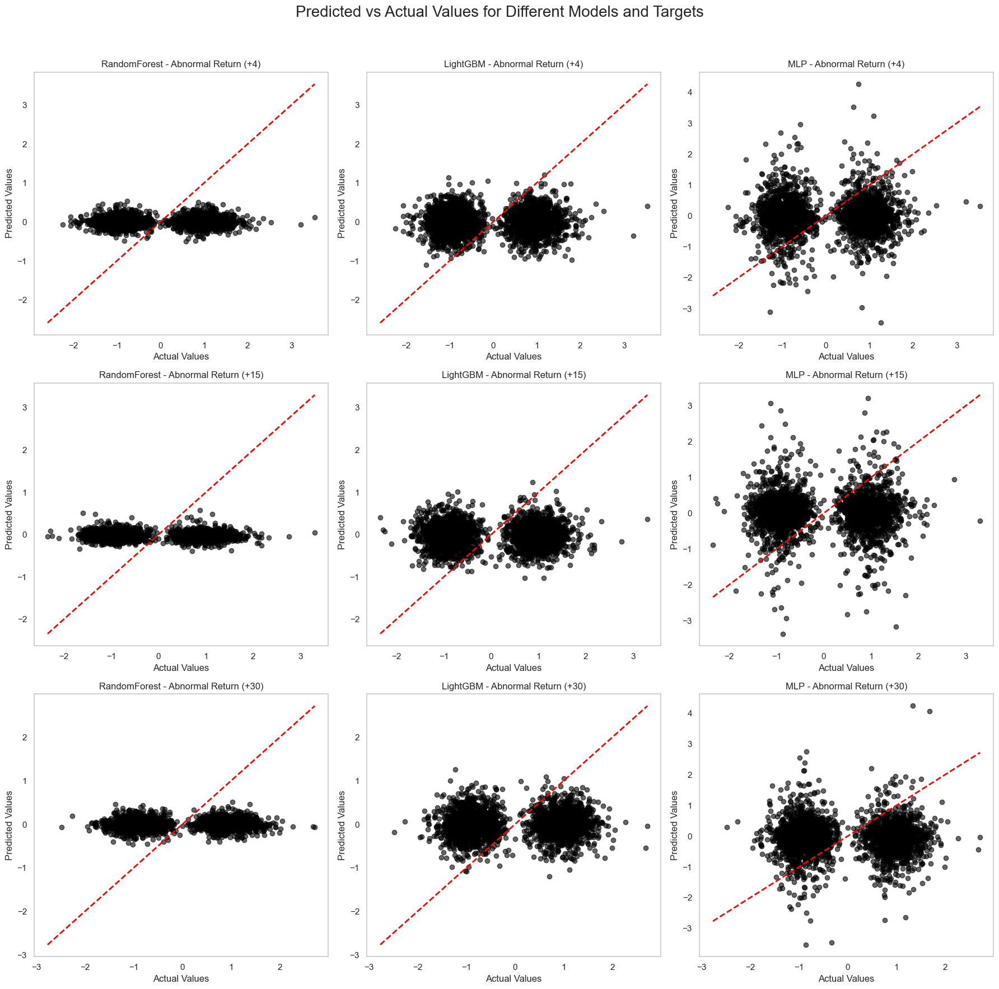

In [70]:
import numpy as np
import matplotlib.pyplot as plt

def get_predictions(model, X, y, cv):
    y_true_list = []
    y_pred_list = []

    for train_index, test_index in cv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        y_true_list.extend(y_test)
        y_pred_list.extend(y_pred)

    return np.array(y_true_list), np.array(y_pred_list)

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()
fig.suptitle('Predicted vs Actual Values for Different Models and Targets', fontsize=20)
plot_count = 0

for target in y_targets:
    X = X_combined[features_minus_3]
    y = X_combined[target]

    readable_target_name = target_name_mapping.get(target, target)

    for model_name, model in models.items():
        y_true, y_pred = get_predictions(model, X, y, cv)

        ax = axes[plot_count]

        ax.grid(False)
        ax.scatter(y_true, y_pred, alpha=0.6, color='black', label=model_name)
        ax.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--', lw=2)
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        ax.set_title(f'{model_name} - {readable_target_name}')
        plot_count += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()




Processing target variable: index_4_abnormal_return_value
Calculating feature importance for RandomForest with target Abnormal Return (+4)...
Calculating feature importance for LightGBM with target Abnormal Return (+4)...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.009266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py



Processing target variable: index_15_abnormal_return_value
Calculating feature importance for RandomForest with target Abnormal Return (+15)...
Calculating feature importance for LightGBM with target Abnormal Return (+15)...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score -0.018226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py



Processing target variable: index_30_abnormal_return_value
Calculating feature importance for RandomForest with target Abnormal Return (+30)...
Calculating feature importance for LightGBM with target Abnormal Return (+30)...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4207
[LightGBM] [Info] Number of data points in the train set: 523, number of used features: 25
[LightGBM] [Info] Start training from score 0.028505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/chinmaymalhotra/Desktop/Data Science Future/Dissertation Financial Code/.venv/lib/py

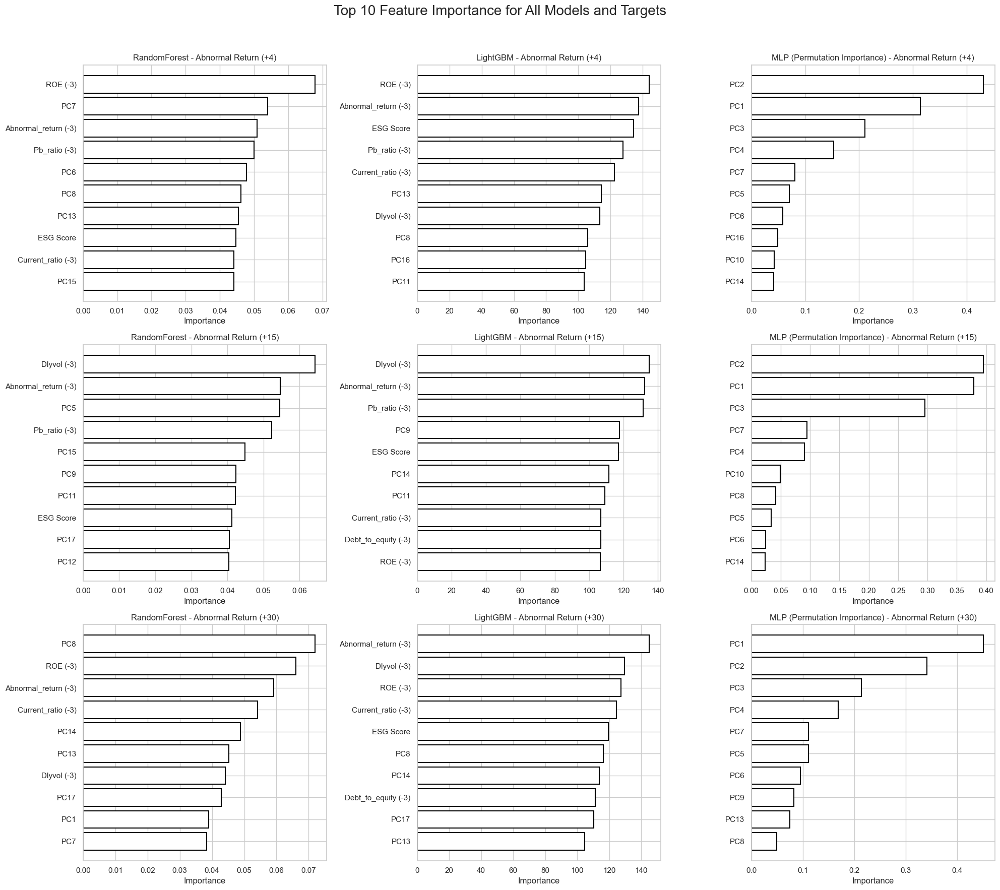

In [72]:
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance


cv = TimeSeriesSplit(n_splits=5)

def calculate_and_return_feature_importance(model, model_name, X, y, cv):
    all_importances = []

    for train_index, test_index in cv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        model.fit(X_train, y_train)

        if hasattr(model, 'feature_importances_'):
            all_importances.append(model.feature_importances_)

    avg_importances = np.mean(all_importances, axis=0)

    feature_importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': avg_importances
    }).sort_values(by='Importance', ascending=False)

    feature_importance_df['Feature'] = feature_importance_df['Feature'].map(feature_name_mapping)

    return feature_importance_df.head(10)

def calculate_mlp_permutation_importance(mlp_model, X, y, cv):
    all_importances = []

    for train_index, test_index in cv.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        mlp_model.fit(X_train, y_train)
        perm_importance = permutation_importance(mlp_model, X_test, y_test, n_repeats=10, random_state=42)
        all_importances.append(perm_importance.importances_mean)

    avg_importances = np.mean(all_importances, axis=0)

    feature_importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': avg_importances
    }).sort_values(by='Importance', ascending=False)

    feature_importance_df['Feature'] = feature_importance_df['Feature'].map(feature_name_mapping)

    return feature_importance_df.head(10)

fig, axes = plt.subplots(3, 3, figsize=(20, 18))
fig.suptitle("Top 10 Feature Importance for All Models and Targets", fontsize=20)
plot_count = 0

for target in y_targets:
    print(f"\n\nProcessing target variable: {target}")

    y = X_combined[target]
    readable_target_name = target_name_mapping[target]
    
    model_axes_titles = ['RandomForest', 'LightGBM', 'MLP (Permutation Importance)']
    
    for i, (model_name, model) in enumerate(models.items()):
        print(f"Calculating feature importance for {model_name} with target {readable_target_name}...")
        if model_name == 'MLP':
            feature_importance_df = calculate_mlp_permutation_importance(model, X, y, cv)
        else:
            feature_importance_df = calculate_and_return_feature_importance(model, model_name, X, y, cv)

        ax = axes[plot_count // 3, plot_count % 3]
        
        ax.barh(
            feature_importance_df['Feature'], 
            feature_importance_df['Importance'], 
            color='white',           
            edgecolor='black',       
            linewidth=1.5            
        )
        ax.set_title(f'{model_axes_titles[i]} - {readable_target_name}')
        ax.invert_yaxis() 
        ax.set_xlabel('Importance')

        plot_count += 1

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


## Descriptive Statistics for Academic Research Paper

In [12]:
print(list(X_combined.columns))

['RIC', 'dlycaldt', 'event_date', 'index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 'index_-3_abnormal_return_cuberoot_value', 'index_4_abnormal_return_value', 'index_15_abnormal_return_value', 'index_30_abnormal_return_value', 'ESG_Score', 'Subtopic_Climate_Change', 'Subtopic_Community_Relations', 'Subtopic_Corporate_Governance', 'Subtopic_Human_Capital', 'Subtopic_Natural_Capital', 'Subtopic_Non-ESG', 'Subtopic_Pollution_&_Waste', 'Subtopic_Product_Liability', 'Sentiment_Neutral', 'Sentiment_Positive', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17']


/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/3783862758.py:47: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color=plot_color, ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/3783862758.py:47: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color=plot_color, ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel_87094/3783862758.py:47: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(sampled_data[col], shade=True, color=plot_color, ax=axes[i])
/var/folders/_w/ndnlj7653dv8frnjnxbsc02m0000gn/T/ipykernel

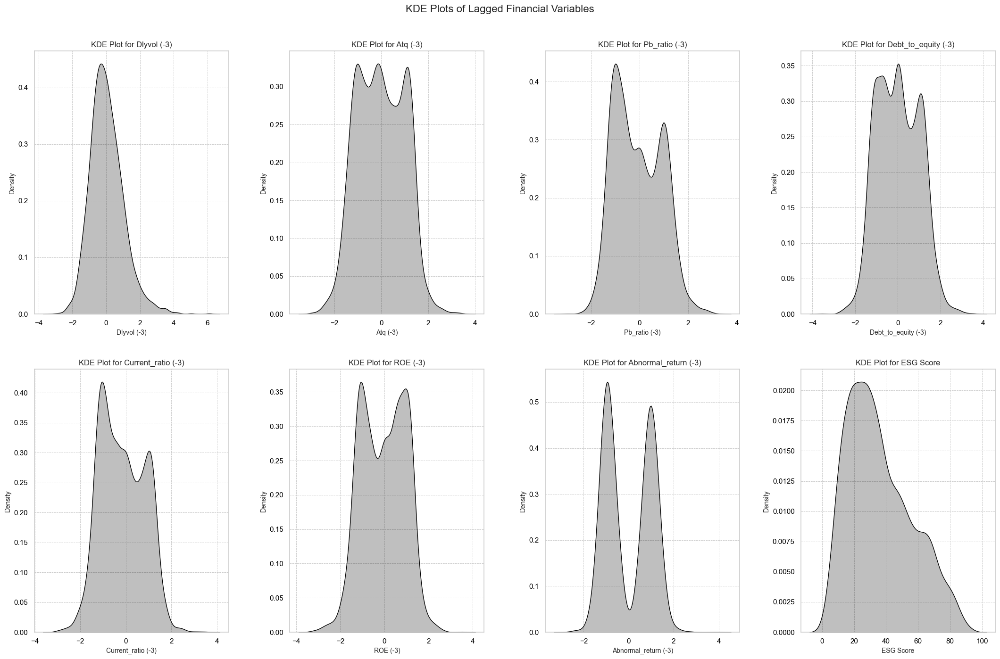

In [14]:
import math
import seaborn as sns
import matplotlib.pyplot as plt

KDEvar = ['index_-3_dlyvol_log_value', 'index_-3_atq_log_value', 'index_-3_pb_ratio_value', 
          'index_-3_debt_to_equity_value', 'index_-3_current_ratio_value', 'index_-3_ROE_value', 
          'index_-3_abnormal_return_cuberoot_value', 'ESG_Score']

new_feature_names = [
    'Dlyvol (-3)',
    'Atq (-3)',
    'Pb_ratio (-3)',
    'Debt_to_equity (-3)',
    'Current_ratio (-3)',
    'ROE (-3)',
    'Abnormal_return (-3)',
    'ESG Score'
]

feature_name_mapping = dict(zip(KDEvar, new_feature_names))
sampled_data = X_combined[KDEvar].copy()
sns.set(style="whitegrid")
n_vars = len(KDEvar)
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(22, 14))
axes = axes.flatten()

plot_color = 'black'

for i, col in enumerate(KDEvar):
    readable_name = feature_name_mapping[col]

    sns.kdeplot(sampled_data[col], shade=True, color=plot_color, ax=axes[i])
    axes[i].set_title(f'KDE Plot for {readable_name}', fontsize=12)
    axes[i].set_xlabel(readable_name, fontsize=10)
    axes[i].set_ylabel('Density', fontsize=10)
    
    axes[i].grid(True, which='both', linestyle='--', linewidth=0.7)
    
    for spine in axes[i].spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.2)
    
    axes[i].tick_params(axis='both', which='major', length=6, width=1.5, colors='black')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=3.0)
fig.suptitle('KDE Plots of Lagged Financial Variables', y=1.02, fontsize=16)
plt.show()

# End of Code